In [5]:
from __future__ import print_function, division
import numpy as np 
import pandas as pd 
import scipy
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import datetime
import sys
import os
import cv2
from skimage import transform
from imageio import imread


Using TensorFlow backend.


In [1]:
!wget  http://transattr.cs.brown.edu/files/aligned_images.tar

--2019-05-02 12:54:35--  http://transattr.cs.brown.edu/files/aligned_images.tar
Resolving transattr.cs.brown.edu (transattr.cs.brown.edu)... 128.148.32.110
Connecting to transattr.cs.brown.edu (transattr.cs.brown.edu)|128.148.32.110|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1890580480 (1.8G) [application/x-tar]
Saving to: ‘aligned_images.tar’

aligned_images.tar  100%[===================>]   1.76G  28.9MB/s    in 68s     

2019-05-02 12:55:43 (26.5 MB/s) - ‘aligned_images.tar’ saved [1890580480/1890580480]



In [2]:
!tar -xvf aligned_images.tar

imageAlignedLD/
imageAlignedLD/00000270/
imageAlignedLD/00000270/1.jpg
imageAlignedLD/00000270/102.jpg
imageAlignedLD/00000270/103.jpg
imageAlignedLD/00000270/108.jpg
imageAlignedLD/00000270/11.jpg
imageAlignedLD/00000270/110.jpg
imageAlignedLD/00000270/111.jpg
imageAlignedLD/00000270/112.jpg
imageAlignedLD/00000270/115.jpg
imageAlignedLD/00000270/117.jpg
imageAlignedLD/00000270/12.jpg
imageAlignedLD/00000270/120.jpg
imageAlignedLD/00000270/123.jpg
imageAlignedLD/00000270/124.jpg
imageAlignedLD/00000270/126.jpg
imageAlignedLD/00000270/13.jpg
imageAlignedLD/00000270/132.jpg
imageAlignedLD/00000270/135.jpg
imageAlignedLD/00000270/136.jpg
imageAlignedLD/00000270/145.jpg
imageAlignedLD/00000270/150.jpg
imageAlignedLD/00000270/156.jpg
imageAlignedLD/00000270/175.jpg
imageAlignedLD/00000270/19.jpg
imageAlignedLD/00000270/194.jpg
imageAlignedLD/00000270/198.jpg
imageAlignedLD/00000270/216.jpg
imageAlignedLD/00000270/219.jpg
imageAlignedLD/00000270/223.jpg
imageAlignedLD/00000270/233.jpg
image

In [6]:
#Hyperparameters

#Output Shape
resolution = (256,256)

# Input shape
img_rows = 256
img_cols = 256
channels = 3
img_shape = (img_rows, img_cols, channels)

# Size of Patch for PatchGAN
patch = int(img_rows / 2**2)
disc_patch = (patch, patch, 1)

# Number of filters for G and D
filters_gen = 64

#Optimizer for the GAN.
optimizer = Adam(0.0002, 0.5)

# def load_images(dataset,batch_size):
#     chance = np.random.random()
#     path = glob('cityscapes/train/*')
#     images = np.random.choice(path, size=batch_size)
#     img_real = []
#     img_labelled = []

#     for imagepath in images:
#         img = cv2.imread(imagepath)
#         width = img.shape[1]
#         width = width//2
#         real_img, labelled_img = img[:, width:, :],img[:, :width, :]
#         real_img,labelled_img = transform.resize(real_img, resolution),transform.resize(labelled_img, resolution)
#         if (chance<0.5):
#             real_img = np.fliplr(real_img)
#             labelled_img = np.fliplr(labelled_img)
#         img_real.append(real_img)
#         img_labelled.append(labelled_img)
#     return np.array(img_labelled),np.array(img_real)

def load_data(batch_size=1, is_testing=False):
    data_type = "train" if not is_testing else "test"
    #path = glob('./datasets/%s/%s/*' % (self.dataset_name, data_type))

    #batch_images = np.random.choice(path, size=batch_size)

    rootdir = 'imageAlignedLD/'
    imgs_A = []
    imgs_B = []
    for img_path in range(batch_size):
        img_A = imread(rootdir+day[img_path][1])
        img_B = imread(rootdir + day[img_path][0])

        #h, w, _ = img.shape
        #_w = int(w/2)
        #img_A, img_B = 

        img_A = scipy.misc.imresize(img_A, resolution)
        img_B = scipy.misc.imresize(img_B, resolution)

        # If training => do random flip (flip the rows)
        if not is_testing and np.random.random() < 0.5:
            img_A = np.fliplr(img_A)
            img_B = np.fliplr(img_B)

        imgs_A.append(img_A)
        imgs_B.append(img_B)

    imgs_A = np.array(imgs_A)/127.5 - 1.
    imgs_B = np.array(imgs_B)/127.5 - 1.

    return imgs_A, imgs_B 
#     return np.array(img_labelled), np.array(img_real)

# REMEBER! - arr1(A) is the actual truth. arr2(B) is the labelled graphical image

# for batch_i, (imgs_A, imgs_B) in enumerate(load_images(1,2)):
#     print("hey")
#arr1,arr2 = load_images('1',32,12)
# arr1.shape

Instructions for updating:
Colocations handled automatically by placer.


In [7]:
def new_generator():
    layer0 = Input(shape=img_shape,name="input")
    layer1 = Conv2D(filters_gen, kernel_size=4,strides = 2,activation = LeakyReLU(alpha=0.2),padding='same')(layer0)
    bd = BatchNormalization(momentum=0.8)(layer1)
    layer2 = Conv2D(filters_gen*2, kernel_size=4,strides = 2,activation = LeakyReLU(alpha=0.2),padding='same')(bd)
    bd = BatchNormalization(momentum=0.8)(layer2)
    layer3 = Conv2D(filters_gen*4, kernel_size=4,strides = 2,activation = LeakyReLU(alpha=0.2),padding='same')(bd)
    bd = BatchNormalization(momentum=0.8)(layer3)
    layer4 = Conv2D(filters_gen*8, kernel_size=4,strides = 2,activation = LeakyReLU(alpha=0.2),padding='same')(bd)
    bd = BatchNormalization(momentum=0.8)(layer4)
    layer5 = Conv2D(filters_gen*8, kernel_size=4,strides = 2,activation = LeakyReLU(alpha=0.2),padding='same')(bd)
    bd = BatchNormalization(momentum=0.8)(layer5)
    layer6 = Conv2D(filters_gen*8, kernel_size=4,strides = 2,activation = LeakyReLU(alpha=0.2),padding='same')(bd)
    bd = BatchNormalization(momentum=0.8)(layer6)
    dropout = Dropout(0.10)(bd)
    layer7 = Conv2D(filters_gen*8, kernel_size=2,strides = 2,activation = LeakyReLU(alpha=0.2),padding='same')(dropout)
    bd = BatchNormalization(momentum=0.8)(layer7)
    def deconv2d(prev_layer, skip_input, filters):
        temp = UpSampling2D(size=2)(prev_layer)
        temp = Conv2D(filters, kernel_size=4, strides=1, padding='same', activation='relu')(temp)
        temp = BatchNormalization(momentum=0.6)(temp)
        temp = Concatenate()([temp, skip_input])
        return temp
    
    u_layer1 = deconv2d(bd, layer6, filters_gen*8)
    u_layer2 = deconv2d(u_layer1, layer5, filters_gen*8)
    u_layer3 = deconv2d(u_layer2, layer4, filters_gen*8)
    u_layer4 = deconv2d(u_layer3, layer3, filters_gen*4)
    dropout = Dropout(0.25)(u_layer4)
    u_layer5 = deconv2d(dropout, layer2, filters_gen*2)
    u_layer6 = deconv2d(u_layer5, layer1, filters_gen)
    u_layer7 = UpSampling2D(size=2)(u_layer6)
    u_layer0 = Conv2D(channels, kernel_size=4, strides=1, padding='same', activation='tanh')(u_layer7)
    return Model(layer0,u_layer0,name="Generator")


def new_discriminator():
    def d_layer(prev_layer, filters):
        print(filters)
        temp = Conv2D(filters, kernel_size=4, strides=2, padding='same')(prev_layer)
        temp = LeakyReLU(alpha=0.2)(temp)
        return temp
    
    layer0_A = Input(shape=img_shape)
    layer0_B = Input(shape=img_shape)
    combined_input = Concatenate(axis=-1)([layer0_A, layer0_B])
    layer1 = d_layer(combined_input, filters_gen)
    layer2 = d_layer(layer1, filters_gen*2)
    #layer3 = d_layer(layer2, filters_gen*4)
    #layer4 = d_layer(layer3, filters_gen*4)
    dropout = Dropout(0.25)(layer2)
    layer5 = Conv2D(1, kernel_size=4, strides=1, padding='same')(dropout)
    return Model([layer0_A, layer0_B], layer5,name="Discriminator")

heaven = new_discriminator()
heaven.summary()


64
128
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 256, 256, 6)  0           input_1[0][0]                    
                                                                 input_2[0][0]                    
______________________________________________________________________________________

In [8]:
'''
1. Two images as input.
2. One image goes to generator
3. Two images go to the discriminator as input
4. We freeze the discriminator weights
5. Create GAN with both models. Inputs - B (Labelled Graphical) as earlier and outputs (A - Ground Truth) as earlier
'''
#<---Since the model is being compiled already here, 
# the flag later of trainable = False does not affect it.--->
d = new_discriminator()
d.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])


g = new_generator()

input_image_A = Input(shape = img_shape)
input_image_B = Input(shape = img_shape)

fake_image_B = g(input_image_B)
validity = d([fake_image_B,input_image_B])

#THIS ONLY STOPS THE TRAINING OF THE DISCRIMINATOR IN THE GAN. IT WILL STILL TRAIN WHEN INVOKED AS JUST D.
d.trainable = False

gan = Model(inputs=[input_image_A,input_image_B],outputs = [validity,fake_image_B],name="GAN")

gan.compile(loss=['mse', 'mae'],
                              loss_weights=[1, 100],
                              optimizer=optimizer)
gan.summary()

64
128


/usr/local/lib/python3.6/dist-packages/keras/activations.py:211: UserWarning: Do not pass a layer instance (such as LeakyReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  identifier=identifier.__class__.__name__))


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
Generator (Model)               (None, 256, 256, 3)  38697859    input_6[0][0]                    
__________________________________________________________________________________________________
Discriminator (Model)           (None, 64, 64, 1)    139457      Generator[1][0]                  
                                                                 input_6[0][0]                    
Total params: 38,837,316
Trainable params: 38,688,899
Non-trainable params: 148,417
__________________________________________________________________________________________________


In [0]:
def plot_img():
    truth,labelled = load_images(1,1,1)
    predict = g.predict(labelled)
    plt.imshow((predict[0] * 255).astype(np.uint8))
    plt.show()
    plt.imshow(truth[0])
    plt.show()

def train(epochs,batch_size):
    valid_scores = np.ones((batch_size,disc_patch[0],disc_patch[1],disc_patch[2]))
    fake_scores = np.zeros((batch_size,disc_patch[0],disc_patch[1],disc_patch[2]))
    for j in range(epochs):
        print("Epoch -",j+1)
        start = datetime.datetime.now()
        for i in range(0,31):
# begin
            images_A,images_B = load_images(1,batch_size,i)
            fake_images = g.predict(images_B)

            #Discriminator losses
            d_loss_real = d.train_on_batch([images_A,images_B],valid_scores)
            d_loss_fake = d.train_on_batch([fake_images,images_B],fake_scores)
            avg_d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            #GAN losses
            gan_loss = gan.train_on_batch([images_A,images_B],[valid_scores,images_A])
# end
        print("Discriminator Loss = ",avg_d_loss[0], "Accuracy =",avg_d_loss[1]*100)
        print("GAN Loss = ",gan_loss[0])
        end = start_time = datetime.datetime.now()
        print("Time Elapsed",end-start,"\n")
        if(j%5==0):
            plot_img()
#     return avg_d_loss, gan_loss


Epoch - 1
Instructions for updating:
Use tf.cast instead.
Discriminator Loss =  0.32198012 Accuracy = 47.705078125
GAN Loss =  19.907347
Time Elapsed 0:00:25.152240 



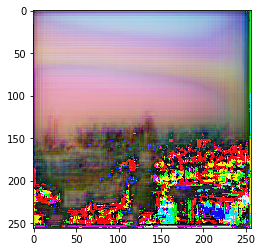

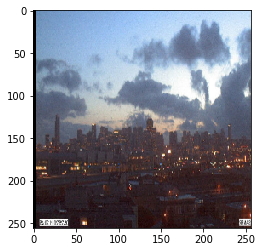

Epoch - 2
Discriminator Loss =  0.30059022 Accuracy = 50.7080078125
GAN Loss =  15.257319
Time Elapsed 0:00:10.636335 

Epoch - 3
Discriminator Loss =  0.3336635 Accuracy = 44.83642578125
GAN Loss =  11.914542
Time Elapsed 0:00:10.549187 

Epoch - 4
Discriminator Loss =  0.32195833 Accuracy = 45.37353515625
GAN Loss =  12.068991
Time Elapsed 0:00:10.596581 

Epoch - 5
Discriminator Loss =  0.31479463 Accuracy = 45.1171875
GAN Loss =  11.1810665
Time Elapsed 0:00:10.978743 

Epoch - 6
Discriminator Loss =  0.38676524 Accuracy = 31.35986328125
GAN Loss =  13.639036
Time Elapsed 0:00:10.963893 



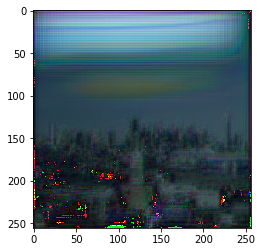

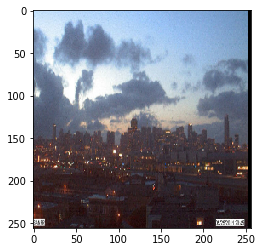

Epoch - 7
Discriminator Loss =  0.27621198 Accuracy = 52.72216796875
GAN Loss =  11.670418
Time Elapsed 0:00:10.997774 

Epoch - 8
Discriminator Loss =  0.34837252 Accuracy = 46.35009765625
GAN Loss =  10.93796
Time Elapsed 0:00:10.907093 

Epoch - 9
Discriminator Loss =  0.7543938 Accuracy = 23.92578125
GAN Loss =  10.928256
Time Elapsed 0:00:11.039519 

Epoch - 10
Discriminator Loss =  0.3173257 Accuracy = 38.0126953125
GAN Loss =  10.79763
Time Elapsed 0:00:10.970418 

Epoch - 11
Discriminator Loss =  0.24847916 Accuracy = 58.0322265625
GAN Loss =  11.077817
Time Elapsed 0:00:11.075212 



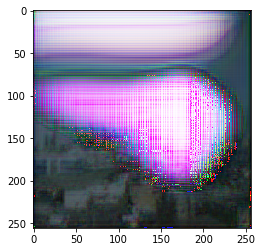

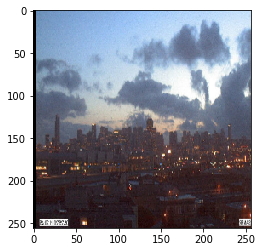

Epoch - 12
Discriminator Loss =  0.21170741 Accuracy = 67.83447265625
GAN Loss =  11.11221
Time Elapsed 0:00:10.985793 

Epoch - 13
Discriminator Loss =  0.24271798 Accuracy = 58.89892578125
GAN Loss =  12.126541
Time Elapsed 0:00:11.089485 

Epoch - 14
Discriminator Loss =  0.22697106 Accuracy = 63.19580078125
GAN Loss =  12.900203
Time Elapsed 0:00:11.093002 

Epoch - 15
Discriminator Loss =  0.20725858 Accuracy = 70.30029296875
GAN Loss =  11.204994
Time Elapsed 0:00:11.039855 

Epoch - 16
Discriminator Loss =  0.18537715 Accuracy = 76.3427734375
GAN Loss =  11.378568
Time Elapsed 0:00:11.044513 



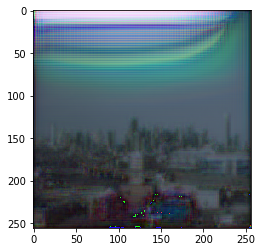

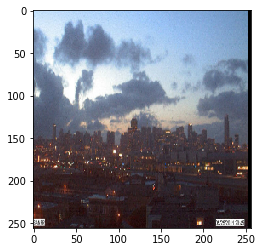

Epoch - 17
Discriminator Loss =  0.17803377 Accuracy = 77.96630859375
GAN Loss =  11.119408
Time Elapsed 0:00:11.090023 

Epoch - 18
Discriminator Loss =  0.16643792 Accuracy = 81.67724609375
GAN Loss =  10.501907
Time Elapsed 0:00:11.072844 

Epoch - 19
Discriminator Loss =  0.18047631 Accuracy = 75.048828125
GAN Loss =  11.578869
Time Elapsed 0:00:10.921943 

Epoch - 20
Discriminator Loss =  0.16493161 Accuracy = 82.421875
GAN Loss =  11.883745
Time Elapsed 0:00:10.874346 

Epoch - 21
Discriminator Loss =  0.16170879 Accuracy = 80.21240234375
GAN Loss =  11.581396
Time Elapsed 0:00:11.097608 



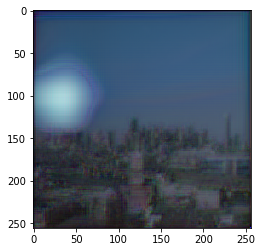

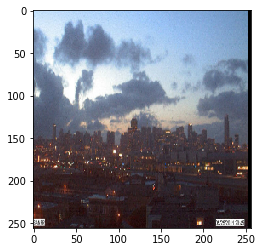

Epoch - 22
Discriminator Loss =  0.18143272 Accuracy = 77.40478515625
GAN Loss =  11.285609
Time Elapsed 0:00:10.899817 

Epoch - 23
Discriminator Loss =  0.21918438 Accuracy = 70.25146484375
GAN Loss =  10.720057
Time Elapsed 0:00:10.823586 

Epoch - 24
Discriminator Loss =  0.23221341 Accuracy = 63.916015625
GAN Loss =  9.917748
Time Elapsed 0:00:10.880401 

Epoch - 25
Discriminator Loss =  0.17729375 Accuracy = 78.4912109375
GAN Loss =  10.833188
Time Elapsed 0:00:10.615006 

Epoch - 26
Discriminator Loss =  0.17358902 Accuracy = 80.84716796875
GAN Loss =  10.7167
Time Elapsed 0:00:10.675553 



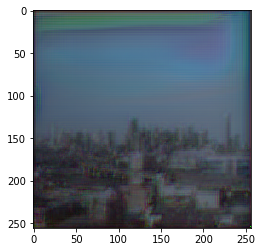

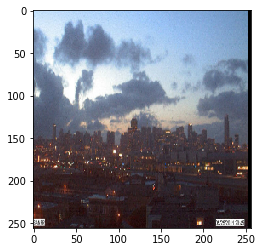

Epoch - 27
Discriminator Loss =  0.18156625 Accuracy = 77.9296875
GAN Loss =  10.619962
Time Elapsed 0:00:10.954314 

Epoch - 28
Discriminator Loss =  0.17773522 Accuracy = 76.28173828125
GAN Loss =  11.151588
Time Elapsed 0:00:10.937111 

Epoch - 29
Discriminator Loss =  0.19585107 Accuracy = 73.974609375
GAN Loss =  10.686932
Time Elapsed 0:00:10.703289 

Epoch - 30
Discriminator Loss =  0.16462015 Accuracy = 81.787109375
GAN Loss =  11.173652
Time Elapsed 0:00:10.502576 

Epoch - 31
Discriminator Loss =  0.15760785 Accuracy = 82.04345703125
GAN Loss =  10.773561
Time Elapsed 0:00:10.615544 



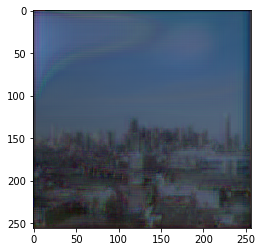

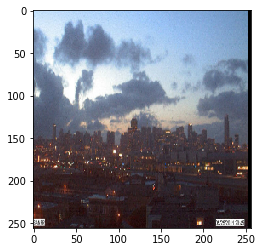

Epoch - 32
Discriminator Loss =  0.15437558 Accuracy = 82.80029296875
GAN Loss =  10.415904
Time Elapsed 0:00:10.820406 

Epoch - 33
Discriminator Loss =  0.14150935 Accuracy = 85.99853515625
GAN Loss =  11.48517
Time Elapsed 0:00:10.580665 

Epoch - 34
Discriminator Loss =  0.14645341 Accuracy = 84.0576171875
GAN Loss =  10.54868
Time Elapsed 0:00:10.576586 

Epoch - 35
Discriminator Loss =  0.14304076 Accuracy = 83.65478515625
GAN Loss =  10.281988
Time Elapsed 0:00:10.625118 

Epoch - 36
Discriminator Loss =  0.15483862 Accuracy = 79.8583984375
GAN Loss =  10.283157
Time Elapsed 0:00:10.610965 



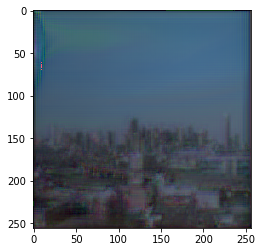

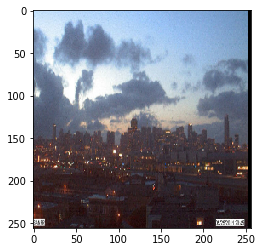

Epoch - 37
Discriminator Loss =  0.17187873 Accuracy = 77.35595703125
GAN Loss =  10.264548
Time Elapsed 0:00:10.659578 

Epoch - 38
Discriminator Loss =  0.2073673 Accuracy = 70.41015625
GAN Loss =  10.9887705
Time Elapsed 0:00:10.807316 

Epoch - 39
Discriminator Loss =  0.17137052 Accuracy = 76.11083984375
GAN Loss =  10.0148325
Time Elapsed 0:00:10.657789 

Epoch - 40
Discriminator Loss =  0.17938937 Accuracy = 74.3408203125
GAN Loss =  10.23282
Time Elapsed 0:00:10.477562 

Epoch - 41
Discriminator Loss =  0.17425272 Accuracy = 76.69677734375
GAN Loss =  10.255711
Time Elapsed 0:00:10.460701 



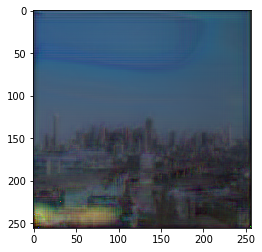

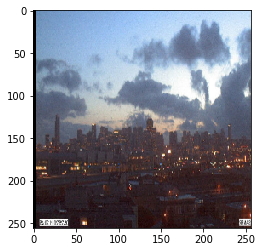

Epoch - 42
Discriminator Loss =  0.1676319 Accuracy = 75.08544921875
GAN Loss =  10.3747835
Time Elapsed 0:00:10.916164 

Epoch - 43
Discriminator Loss =  0.2133328 Accuracy = 69.82421875
GAN Loss =  10.511075
Time Elapsed 0:00:10.986174 

Epoch - 44
Discriminator Loss =  0.24193683 Accuracy = 64.1357421875
GAN Loss =  10.236953
Time Elapsed 0:00:10.993198 

Epoch - 45
Discriminator Loss =  0.25311047 Accuracy = 64.14794921875
GAN Loss =  10.590029
Time Elapsed 0:00:10.775479 

Epoch - 46
Discriminator Loss =  0.18835646 Accuracy = 69.4580078125
GAN Loss =  9.908407
Time Elapsed 0:00:10.908166 



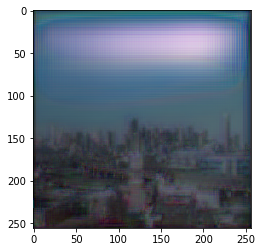

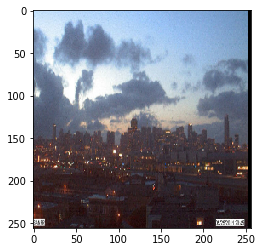

Epoch - 47
Discriminator Loss =  0.16282734 Accuracy = 76.79443359375
GAN Loss =  9.949077
Time Elapsed 0:00:10.863988 

Epoch - 48
Discriminator Loss =  0.16658673 Accuracy = 75.96435546875
GAN Loss =  9.717736
Time Elapsed 0:00:10.984508 

Epoch - 49
Discriminator Loss =  0.19969046 Accuracy = 70.0927734375
GAN Loss =  9.486517
Time Elapsed 0:00:10.952516 

Epoch - 50
Discriminator Loss =  0.21994407 Accuracy = 67.9931640625
GAN Loss =  9.614007
Time Elapsed 0:00:10.736678 

Epoch - 51
Discriminator Loss =  0.237479 Accuracy = 66.49169921875
GAN Loss =  9.464976
Time Elapsed 0:00:10.745794 



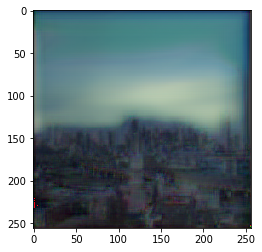

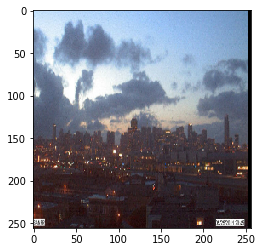

Epoch - 52
Discriminator Loss =  0.2368936 Accuracy = 67.1142578125
GAN Loss =  9.247139
Time Elapsed 0:00:10.780856 

Epoch - 53
Discriminator Loss =  0.19421259 Accuracy = 71.875
GAN Loss =  9.595175
Time Elapsed 0:00:10.826530 

Epoch - 54
Discriminator Loss =  0.18053982 Accuracy = 73.388671875
GAN Loss =  10.069291
Time Elapsed 0:00:10.682668 

Epoch - 55
Discriminator Loss =  0.18558064 Accuracy = 72.4609375
GAN Loss =  9.715522
Time Elapsed 0:00:10.787624 

Epoch - 56
Discriminator Loss =  0.16092464 Accuracy = 79.052734375
GAN Loss =  9.9017315
Time Elapsed 0:00:10.858151 



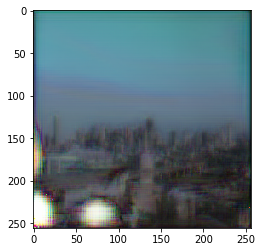

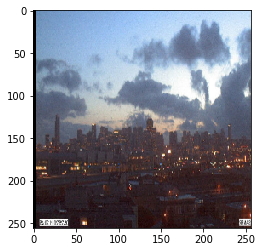

Epoch - 57
Discriminator Loss =  0.17807172 Accuracy = 74.9755859375
GAN Loss =  9.548619
Time Elapsed 0:00:10.780642 

Epoch - 58
Discriminator Loss =  0.1966028 Accuracy = 71.8505859375
GAN Loss =  9.924052
Time Elapsed 0:00:10.813353 

Epoch - 59
Discriminator Loss =  0.19275862 Accuracy = 69.98291015625
GAN Loss =  9.656082
Time Elapsed 0:00:10.710243 

Epoch - 60
Discriminator Loss =  0.19236237 Accuracy = 72.0458984375
GAN Loss =  9.489176
Time Elapsed 0:00:10.727413 

Epoch - 61
Discriminator Loss =  0.26106453 Accuracy = 60.65673828125
GAN Loss =  9.619202
Time Elapsed 0:00:10.740319 



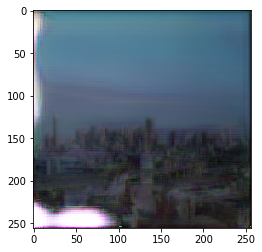

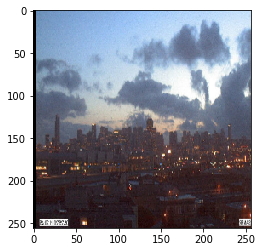

Epoch - 62
Discriminator Loss =  0.22167619 Accuracy = 67.3095703125
GAN Loss =  9.135157
Time Elapsed 0:00:10.802735 

Epoch - 63
Discriminator Loss =  0.21615475 Accuracy = 69.921875
GAN Loss =  8.991289
Time Elapsed 0:00:10.738182 

Epoch - 64
Discriminator Loss =  0.19652955 Accuracy = 69.970703125
GAN Loss =  8.890712
Time Elapsed 0:00:10.829748 

Epoch - 65
Discriminator Loss =  0.20866099 Accuracy = 68.10302734375
GAN Loss =  8.737549
Time Elapsed 0:00:10.829709 

Epoch - 66
Discriminator Loss =  0.22686125 Accuracy = 64.17236328125
GAN Loss =  9.042108
Time Elapsed 0:00:10.734006 



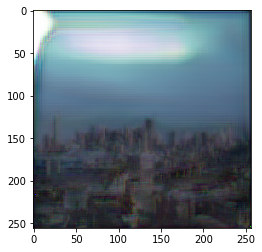

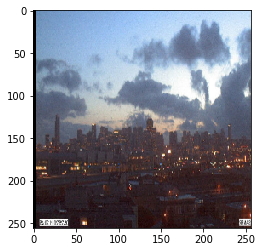

Epoch - 67
Discriminator Loss =  0.18314368 Accuracy = 72.7783203125
GAN Loss =  9.118921
Time Elapsed 0:00:10.880532 

Epoch - 68
Discriminator Loss =  0.17947242 Accuracy = 75.47607421875
GAN Loss =  9.664219
Time Elapsed 0:00:10.785216 

Epoch - 69
Discriminator Loss =  0.16326547 Accuracy = 77.7099609375
GAN Loss =  9.336703
Time Elapsed 0:00:10.792404 

Epoch - 70
Discriminator Loss =  0.6030949 Accuracy = 11.56005859375
GAN Loss =  10.115483
Time Elapsed 0:00:10.810669 

Epoch - 71
Discriminator Loss =  0.23872654 Accuracy = 63.6962890625
GAN Loss =  9.706148
Time Elapsed 0:00:10.887560 



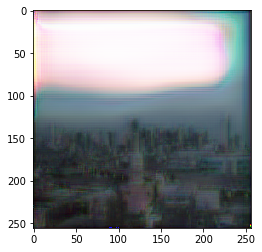

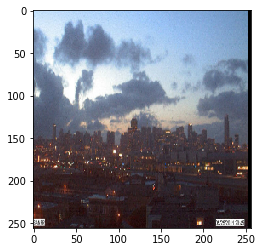

Epoch - 72
Discriminator Loss =  0.18217653 Accuracy = 72.8759765625
GAN Loss =  9.296508
Time Elapsed 0:00:10.747393 

Epoch - 73
Discriminator Loss =  0.17817706 Accuracy = 74.71923828125
GAN Loss =  8.791155
Time Elapsed 0:00:10.375452 

Epoch - 74
Discriminator Loss =  0.20156313 Accuracy = 71.2890625
GAN Loss =  8.54116
Time Elapsed 0:00:10.370469 

Epoch - 75
Discriminator Loss =  0.19904874 Accuracy = 70.71533203125
GAN Loss =  8.776414
Time Elapsed 0:00:10.783379 

Epoch - 76
Discriminator Loss =  0.14980496 Accuracy = 81.50634765625
GAN Loss =  9.019002
Time Elapsed 0:00:10.883148 



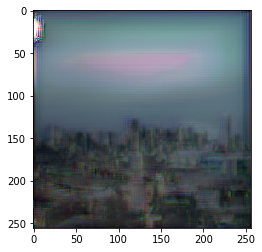

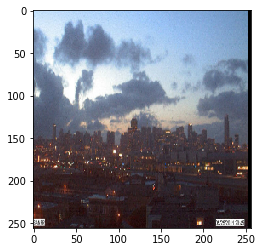

Epoch - 77
Discriminator Loss =  0.15931293 Accuracy = 75.5859375
GAN Loss =  13.7527075
Time Elapsed 0:00:10.888721 

Epoch - 78
Discriminator Loss =  0.20430598 Accuracy = 69.07958984375
GAN Loss =  9.839229
Time Elapsed 0:00:10.758108 

Epoch - 79
Discriminator Loss =  0.1807714 Accuracy = 72.71728515625
GAN Loss =  9.897763
Time Elapsed 0:00:10.606915 

Epoch - 80
Discriminator Loss =  0.19862215 Accuracy = 68.798828125
GAN Loss =  8.737637
Time Elapsed 0:00:10.849386 

Epoch - 81
Discriminator Loss =  0.18868643 Accuracy = 70.17822265625
GAN Loss =  9.171243
Time Elapsed 0:00:10.936494 



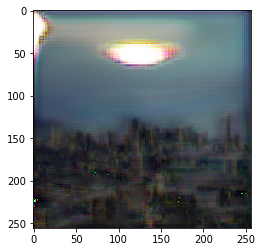

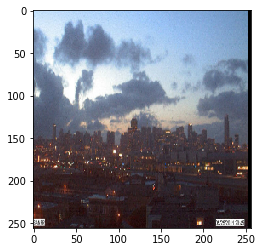

Epoch - 82
Discriminator Loss =  0.19751322 Accuracy = 67.39501953125
GAN Loss =  9.187826
Time Elapsed 0:00:10.785306 

Epoch - 83
Discriminator Loss =  0.2306701 Accuracy = 62.21923828125
GAN Loss =  8.945708
Time Elapsed 0:00:10.520887 

Epoch - 84
Discriminator Loss =  0.25161052 Accuracy = 62.255859375
GAN Loss =  9.416618
Time Elapsed 0:00:10.510373 

Epoch - 85
Discriminator Loss =  0.19287366 Accuracy = 73.37646484375
GAN Loss =  8.818954
Time Elapsed 0:00:10.529373 

Epoch - 86
Discriminator Loss =  0.23606646 Accuracy = 63.22021484375
GAN Loss =  8.803311
Time Elapsed 0:00:10.520614 



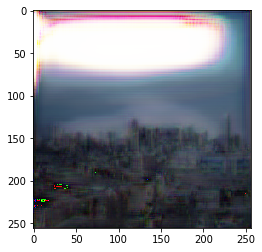

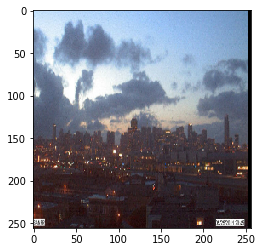

Epoch - 87
Discriminator Loss =  0.1799385 Accuracy = 74.7802734375
GAN Loss =  9.501528
Time Elapsed 0:00:10.547524 

Epoch - 88
Discriminator Loss =  0.21841058 Accuracy = 66.6015625
GAN Loss =  9.9035425
Time Elapsed 0:00:10.593394 

Epoch - 89
Discriminator Loss =  0.19668712 Accuracy = 72.79052734375
GAN Loss =  8.887525
Time Elapsed 0:00:10.544611 

Epoch - 90
Discriminator Loss =  0.17745209 Accuracy = 74.91455078125
GAN Loss =  10.069586
Time Elapsed 0:00:10.516245 

Epoch - 91
Discriminator Loss =  0.25434607 Accuracy = 60.1806640625
GAN Loss =  9.874878
Time Elapsed 0:00:10.512970 



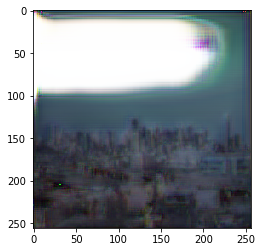

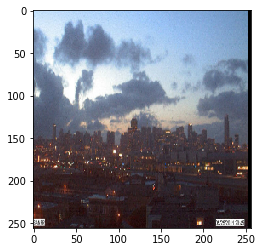

Epoch - 92
Discriminator Loss =  0.19544673 Accuracy = 73.2666015625
GAN Loss =  9.468966
Time Elapsed 0:00:10.589047 

Epoch - 93
Discriminator Loss =  0.18552561 Accuracy = 75.03662109375
GAN Loss =  9.093033
Time Elapsed 0:00:10.597329 

Epoch - 94
Discriminator Loss =  0.32326168 Accuracy = 51.6357421875
GAN Loss =  9.858158
Time Elapsed 0:00:10.805619 

Epoch - 95
Discriminator Loss =  0.19668356 Accuracy = 73.20556640625
GAN Loss =  9.953504
Time Elapsed 0:00:10.861070 

Epoch - 96
Discriminator Loss =  0.19312528 Accuracy = 73.6083984375
GAN Loss =  9.053905
Time Elapsed 0:00:10.647178 



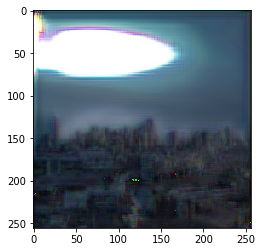

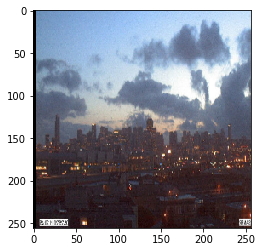

Epoch - 97
Discriminator Loss =  0.21398823 Accuracy = 65.6982421875
GAN Loss =  9.599841
Time Elapsed 0:00:10.768660 

Epoch - 98
Discriminator Loss =  0.1939874 Accuracy = 73.33984375
GAN Loss =  10.379568
Time Elapsed 0:00:10.838895 

Epoch - 99
Discriminator Loss =  0.17922892 Accuracy = 76.416015625
GAN Loss =  8.256479
Time Elapsed 0:00:10.969844 

Epoch - 100
Discriminator Loss =  0.22140944 Accuracy = 65.966796875
GAN Loss =  10.782446
Time Elapsed 0:00:10.724398 

Epoch - 101
Discriminator Loss =  0.21273889 Accuracy = 66.4794921875
GAN Loss =  9.267392
Time Elapsed 0:00:10.730086 



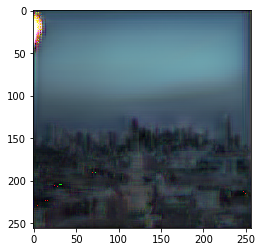

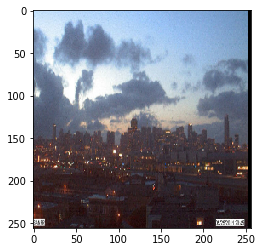

Epoch - 102
Discriminator Loss =  0.2199569 Accuracy = 67.22412109375
GAN Loss =  8.666551
Time Elapsed 0:00:10.817604 

Epoch - 103
Discriminator Loss =  0.19663689 Accuracy = 70.60546875
GAN Loss =  8.920438
Time Elapsed 0:00:10.803613 

Epoch - 104
Discriminator Loss =  0.19769669 Accuracy = 71.69189453125
GAN Loss =  8.5391035
Time Elapsed 0:00:10.896716 

Epoch - 105
Discriminator Loss =  0.25459516 Accuracy = 53.02734375
GAN Loss =  9.991052
Time Elapsed 0:00:11.006692 

Epoch - 106
Discriminator Loss =  0.17528614 Accuracy = 75.84228515625
GAN Loss =  9.561302
Time Elapsed 0:00:10.961384 



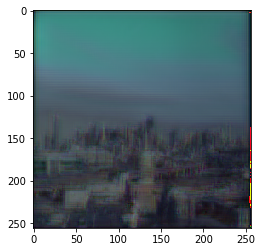

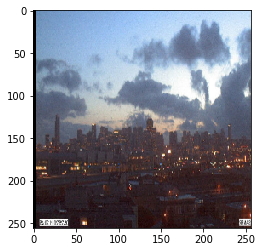

Epoch - 107
Discriminator Loss =  0.1577992 Accuracy = 79.91943359375
GAN Loss =  9.078487
Time Elapsed 0:00:10.882267 

Epoch - 108
Discriminator Loss =  0.17067233 Accuracy = 75.78125
GAN Loss =  10.314991
Time Elapsed 0:00:11.051132 

Epoch - 109
Discriminator Loss =  0.19815856 Accuracy = 68.56689453125
GAN Loss =  8.891077
Time Elapsed 0:00:10.934775 

Epoch - 110
Discriminator Loss =  0.16619805 Accuracy = 74.91455078125
GAN Loss =  8.988333
Time Elapsed 0:00:10.789827 

Epoch - 111
Discriminator Loss =  0.16322717 Accuracy = 78.11279296875
GAN Loss =  10.139453
Time Elapsed 0:00:10.556225 



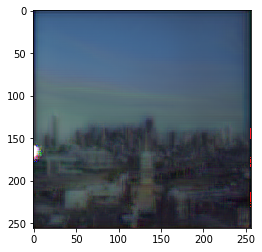

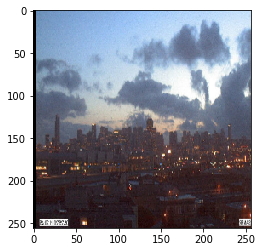

Epoch - 112
Discriminator Loss =  0.14701873 Accuracy = 80.6640625
GAN Loss =  8.71635
Time Elapsed 0:00:10.820034 

Epoch - 113
Discriminator Loss =  0.17994837 Accuracy = 77.392578125
GAN Loss =  10.459613
Time Elapsed 0:00:10.555738 

Epoch - 114
Discriminator Loss =  0.22106265 Accuracy = 67.59033203125
GAN Loss =  11.734636
Time Elapsed 0:00:10.614449 

Epoch - 115
Discriminator Loss =  0.16211954 Accuracy = 80.95703125
GAN Loss =  9.777568
Time Elapsed 0:00:10.565476 

Epoch - 116
Discriminator Loss =  0.16840936 Accuracy = 78.79638671875
GAN Loss =  10.381989
Time Elapsed 0:00:10.511056 



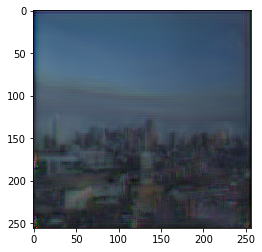

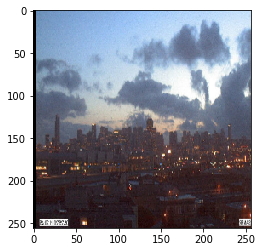

Epoch - 117
Discriminator Loss =  0.15983227 Accuracy = 78.72314453125
GAN Loss =  8.861156
Time Elapsed 0:00:10.674842 

Epoch - 118
Discriminator Loss =  0.17574117 Accuracy = 77.69775390625
GAN Loss =  9.138363
Time Elapsed 0:00:10.863738 

Epoch - 119
Discriminator Loss =  0.1844994 Accuracy = 76.66015625
GAN Loss =  9.061844
Time Elapsed 0:00:10.595314 

Epoch - 120
Discriminator Loss =  0.162007 Accuracy = 80.1025390625
GAN Loss =  14.864376
Time Elapsed 0:00:10.531824 

Epoch - 121
Discriminator Loss =  0.19053975 Accuracy = 77.62451171875
GAN Loss =  9.4727955
Time Elapsed 0:00:10.572813 



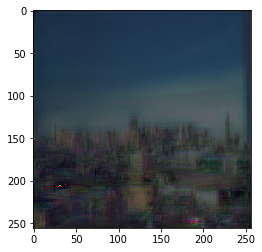

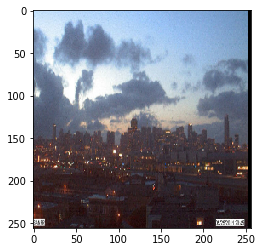

Epoch - 122
Discriminator Loss =  0.16949925 Accuracy = 78.94287109375
GAN Loss =  9.792861
Time Elapsed 0:00:10.561269 

Epoch - 123
Discriminator Loss =  0.17378841 Accuracy = 76.6845703125
GAN Loss =  9.608634
Time Elapsed 0:00:10.581993 

Epoch - 124
Discriminator Loss =  0.18649302 Accuracy = 74.4873046875
GAN Loss =  12.694545
Time Elapsed 0:00:10.631649 

Epoch - 125
Discriminator Loss =  0.17833582 Accuracy = 76.416015625
GAN Loss =  10.810788
Time Elapsed 0:00:10.605416 

Epoch - 126
Discriminator Loss =  0.19083348 Accuracy = 75.89111328125
GAN Loss =  9.280654
Time Elapsed 0:00:10.549458 



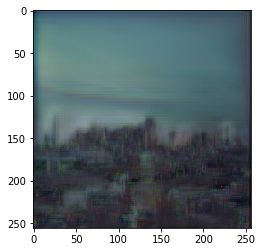

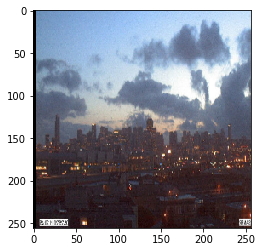

Epoch - 127
Discriminator Loss =  0.1645978 Accuracy = 78.30810546875
GAN Loss =  10.2110615
Time Elapsed 0:00:10.607381 

Epoch - 128
Discriminator Loss =  0.17941535 Accuracy = 75.9765625
GAN Loss =  9.347277
Time Elapsed 0:00:10.518397 

Epoch - 129
Discriminator Loss =  0.18749522 Accuracy = 74.8291015625
GAN Loss =  11.099329
Time Elapsed 0:00:10.514403 

Epoch - 130
Discriminator Loss =  0.18301806 Accuracy = 75.8544921875
GAN Loss =  8.408306
Time Elapsed 0:00:10.580985 

Epoch - 131
Discriminator Loss =  0.16250958 Accuracy = 78.02734375
GAN Loss =  8.864699
Time Elapsed 0:00:10.592432 



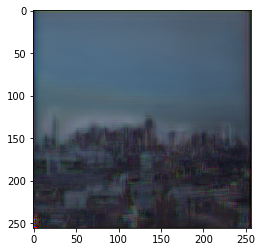

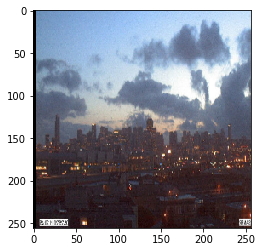

Epoch - 132
Discriminator Loss =  0.16058356 Accuracy = 78.9306640625
GAN Loss =  8.407107
Time Elapsed 0:00:10.715203 

Epoch - 133
Discriminator Loss =  0.16158476 Accuracy = 77.587890625
GAN Loss =  7.644387
Time Elapsed 0:00:10.918150 

Epoch - 134
Discriminator Loss =  0.17445175 Accuracy = 78.173828125
GAN Loss =  7.9326773
Time Elapsed 0:00:10.892101 

Epoch - 135
Discriminator Loss =  0.17392513 Accuracy = 77.52685546875
GAN Loss =  7.779047
Time Elapsed 0:00:10.944521 

Epoch - 136
Discriminator Loss =  0.18590692 Accuracy = 77.24609375
GAN Loss =  7.6830974
Time Elapsed 0:00:10.809654 



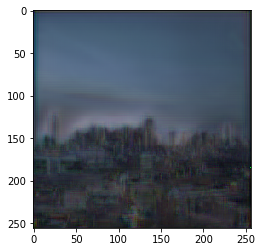

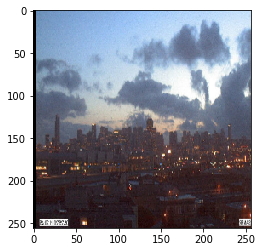

Epoch - 137
Discriminator Loss =  0.18914938 Accuracy = 76.3427734375
GAN Loss =  7.3506627
Time Elapsed 0:00:10.845949 

Epoch - 138
Discriminator Loss =  0.17899261 Accuracy = 76.953125
GAN Loss =  7.401994
Time Elapsed 0:00:10.725555 

Epoch - 139
Discriminator Loss =  0.16809344 Accuracy = 77.91748046875
GAN Loss =  8.463418
Time Elapsed 0:00:10.575888 

Epoch - 140
Discriminator Loss =  0.18401016 Accuracy = 76.62353515625
GAN Loss =  8.525047
Time Elapsed 0:00:10.554180 

Epoch - 141
Discriminator Loss =  0.1888181 Accuracy = 76.611328125
GAN Loss =  7.8771977
Time Elapsed 0:00:10.610445 



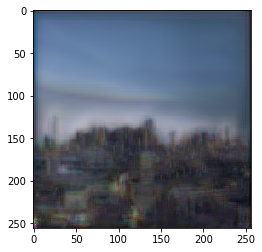

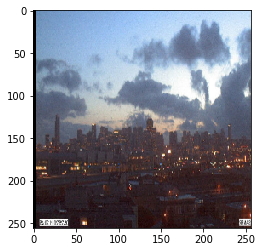

Epoch - 142
Discriminator Loss =  0.18278849 Accuracy = 77.24609375
GAN Loss =  6.6314464
Time Elapsed 0:00:10.748046 

Epoch - 143
Discriminator Loss =  0.19523427 Accuracy = 76.42822265625
GAN Loss =  6.999746
Time Elapsed 0:00:10.619199 

Epoch - 144
Discriminator Loss =  0.1923325 Accuracy = 76.025390625
GAN Loss =  8.864427
Time Elapsed 0:00:10.549223 

Epoch - 145
Discriminator Loss =  0.18775699 Accuracy = 76.74560546875
GAN Loss =  7.6645975
Time Elapsed 0:00:10.517089 

Epoch - 146
Discriminator Loss =  0.18422006 Accuracy = 75.69580078125
GAN Loss =  7.2238917
Time Elapsed 0:00:10.549425 



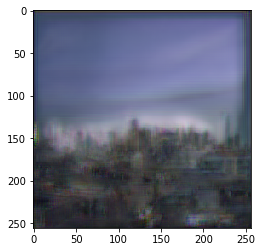

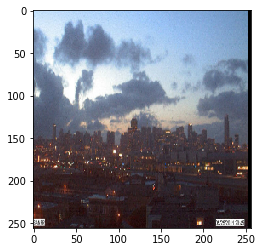

Epoch - 147
Discriminator Loss =  0.17804305 Accuracy = 76.96533203125
GAN Loss =  7.3486295
Time Elapsed 0:00:10.730748 

Epoch - 148
Discriminator Loss =  0.16971791 Accuracy = 77.13623046875
GAN Loss =  6.8208017
Time Elapsed 0:00:10.829205 

Epoch - 149
Discriminator Loss =  0.17755136 Accuracy = 75.87890625
GAN Loss =  6.882824
Time Elapsed 0:00:10.718233 

Epoch - 150
Discriminator Loss =  0.17110568 Accuracy = 77.783203125
GAN Loss =  6.6227813
Time Elapsed 0:00:10.594361 

Epoch - 151
Discriminator Loss =  0.17284706 Accuracy = 77.52685546875
GAN Loss =  7.8496456
Time Elapsed 0:00:10.684264 



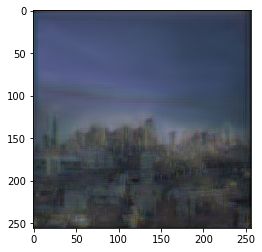

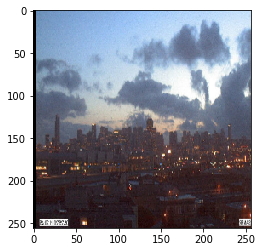

Epoch - 152
Discriminator Loss =  0.17886132 Accuracy = 76.98974609375
GAN Loss =  7.5013266
Time Elapsed 0:00:10.789744 

Epoch - 153
Discriminator Loss =  0.15721592 Accuracy = 77.8564453125
GAN Loss =  6.9904532
Time Elapsed 0:00:10.730790 

Epoch - 154
Discriminator Loss =  0.16509324 Accuracy = 77.3681640625
GAN Loss =  7.779131
Time Elapsed 0:00:10.868860 

Epoch - 155
Discriminator Loss =  0.18120897 Accuracy = 76.50146484375
GAN Loss =  6.867846
Time Elapsed 0:00:10.668351 

Epoch - 156
Discriminator Loss =  0.17061189 Accuracy = 78.16162109375
GAN Loss =  6.7938623
Time Elapsed 0:00:10.479643 



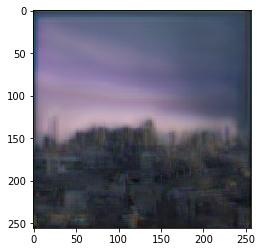

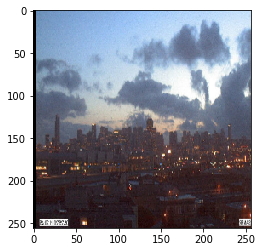

Epoch - 157
Discriminator Loss =  0.18004203 Accuracy = 76.025390625
GAN Loss =  7.338215
Time Elapsed 0:00:10.660492 

Epoch - 158
Discriminator Loss =  0.17047901 Accuracy = 76.6845703125
GAN Loss =  7.385342
Time Elapsed 0:00:10.561075 

Epoch - 159
Discriminator Loss =  0.17954981 Accuracy = 76.84326171875
GAN Loss =  6.4742694
Time Elapsed 0:00:10.476553 

Epoch - 160
Discriminator Loss =  0.17267479 Accuracy = 77.25830078125
GAN Loss =  6.4884386
Time Elapsed 0:00:10.444170 

Epoch - 161
Discriminator Loss =  0.1723855 Accuracy = 76.89208984375
GAN Loss =  6.8006687
Time Elapsed 0:00:10.546047 



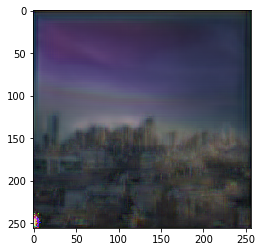

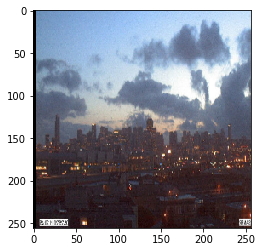

Epoch - 162
Discriminator Loss =  0.16684309 Accuracy = 77.11181640625
GAN Loss =  8.857103
Time Elapsed 0:00:10.779410 

Epoch - 163
Discriminator Loss =  0.1750136 Accuracy = 77.99072265625
GAN Loss =  6.591651
Time Elapsed 0:00:10.864353 

Epoch - 164
Discriminator Loss =  0.17100573 Accuracy = 77.89306640625
GAN Loss =  7.309325
Time Elapsed 0:00:10.876548 

Epoch - 165
Discriminator Loss =  0.18061298 Accuracy = 76.123046875
GAN Loss =  7.803341
Time Elapsed 0:00:10.766225 

Epoch - 166
Discriminator Loss =  0.17779021 Accuracy = 76.30615234375
GAN Loss =  7.420333
Time Elapsed 0:00:10.875861 



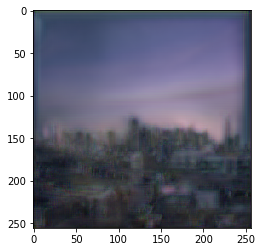

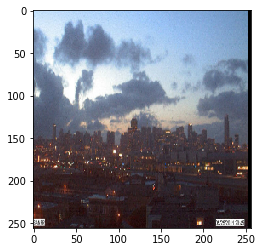

Epoch - 167
Discriminator Loss =  0.1724633 Accuracy = 77.40478515625
GAN Loss =  7.4729137
Time Elapsed 0:00:10.624507 

Epoch - 168
Discriminator Loss =  0.15986119 Accuracy = 78.369140625
GAN Loss =  6.4465694
Time Elapsed 0:00:10.863351 

Epoch - 169
Discriminator Loss =  0.16138445 Accuracy = 78.38134765625
GAN Loss =  6.523468
Time Elapsed 0:00:10.801954 

Epoch - 170
Discriminator Loss =  0.18458895 Accuracy = 76.1474609375
GAN Loss =  8.193028
Time Elapsed 0:00:10.738190 

Epoch - 171
Discriminator Loss =  0.16239263 Accuracy = 77.94189453125
GAN Loss =  7.4000087
Time Elapsed 0:00:10.689352 



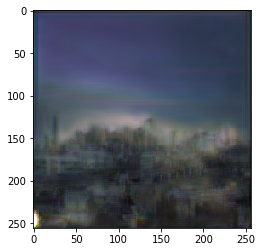

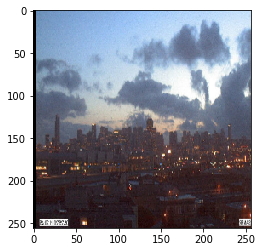

Epoch - 172
Discriminator Loss =  0.1908882 Accuracy = 73.486328125
GAN Loss =  7.413477
Time Elapsed 0:00:10.853905 

Epoch - 173
Discriminator Loss =  0.19468562 Accuracy = 76.96533203125
GAN Loss =  6.866981
Time Elapsed 0:00:10.757817 

Epoch - 174
Discriminator Loss =  0.16663672 Accuracy = 77.1728515625
GAN Loss =  7.2173605
Time Elapsed 0:00:10.873169 

Epoch - 175
Discriminator Loss =  0.17096902 Accuracy = 77.880859375
GAN Loss =  6.6993403
Time Elapsed 0:00:10.926938 

Epoch - 176
Discriminator Loss =  0.15964821 Accuracy = 77.4658203125
GAN Loss =  6.537593
Time Elapsed 0:00:10.750650 



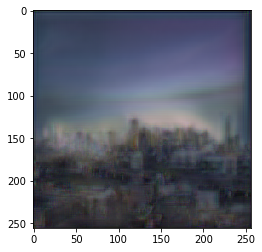

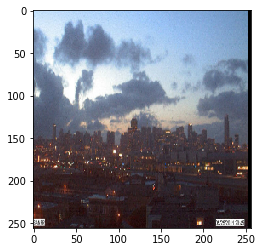

Epoch - 177
Discriminator Loss =  0.15068388 Accuracy = 79.4677734375
GAN Loss =  6.6374097
Time Elapsed 0:00:10.553446 

Epoch - 178
Discriminator Loss =  0.16078645 Accuracy = 78.84521484375
GAN Loss =  6.9978147
Time Elapsed 0:00:10.474804 

Epoch - 179
Discriminator Loss =  0.15817887 Accuracy = 78.35693359375
GAN Loss =  6.984588
Time Elapsed 0:00:10.562460 

Epoch - 180
Discriminator Loss =  0.16740717 Accuracy = 78.57666015625
GAN Loss =  6.7908015
Time Elapsed 0:00:10.460021 

Epoch - 181
Discriminator Loss =  0.16287905 Accuracy = 77.20947265625
GAN Loss =  6.2757664
Time Elapsed 0:00:10.441784 



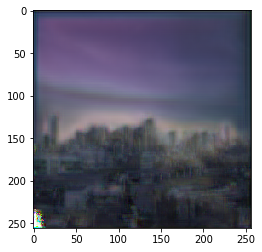

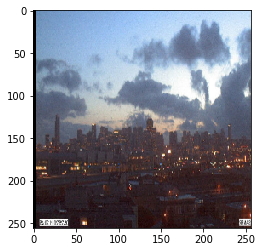

Epoch - 182
Discriminator Loss =  0.17260994 Accuracy = 76.904296875
GAN Loss =  7.1453376
Time Elapsed 0:00:10.648036 

Epoch - 183
Discriminator Loss =  0.29882133 Accuracy = 58.9599609375
GAN Loss =  8.827207
Time Elapsed 0:00:10.514881 

Epoch - 184
Discriminator Loss =  0.17887886 Accuracy = 75.89111328125
GAN Loss =  8.762559
Time Elapsed 0:00:10.463179 

Epoch - 185
Discriminator Loss =  0.18604162 Accuracy = 74.69482421875
GAN Loss =  8.616451
Time Elapsed 0:00:10.534664 

Epoch - 186
Discriminator Loss =  0.17883816 Accuracy = 77.72216796875
GAN Loss =  7.9236226
Time Elapsed 0:00:10.519976 



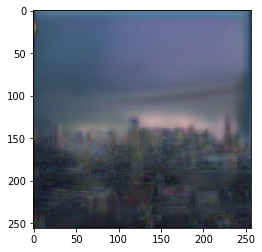

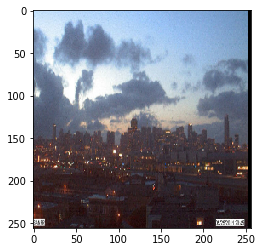

Epoch - 187
Discriminator Loss =  0.16765699 Accuracy = 76.7578125
GAN Loss =  8.106655
Time Elapsed 0:00:10.515796 

Epoch - 188
Discriminator Loss =  0.1526763 Accuracy = 78.2470703125
GAN Loss =  7.515604
Time Elapsed 0:00:10.590735 

Epoch - 189
Discriminator Loss =  0.15380923 Accuracy = 77.6611328125
GAN Loss =  6.41035
Time Elapsed 0:00:10.987707 

Epoch - 190
Discriminator Loss =  0.1512779 Accuracy = 78.6376953125
GAN Loss =  7.3537207
Time Elapsed 0:00:10.901337 

Epoch - 191
Discriminator Loss =  0.16467245 Accuracy = 78.2958984375
GAN Loss =  6.755366
Time Elapsed 0:00:10.911437 



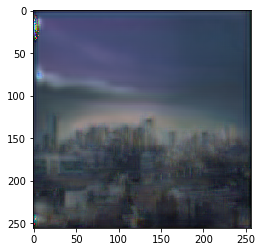

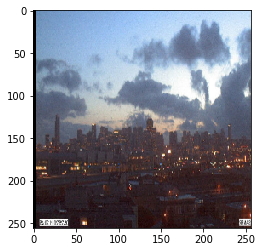

Epoch - 192
Discriminator Loss =  0.1507008 Accuracy = 78.6865234375
GAN Loss =  6.8996115
Time Elapsed 0:00:10.933479 

Epoch - 193
Discriminator Loss =  0.15848367 Accuracy = 78.35693359375
GAN Loss =  6.287851
Time Elapsed 0:00:10.996351 

Epoch - 194
Discriminator Loss =  0.15922184 Accuracy = 78.86962890625
GAN Loss =  7.1313114
Time Elapsed 0:00:10.929485 

Epoch - 195
Discriminator Loss =  0.15626341 Accuracy = 78.30810546875
GAN Loss =  7.2862563
Time Elapsed 0:00:10.932680 

Epoch - 196
Discriminator Loss =  0.16510606 Accuracy = 77.84423828125
GAN Loss =  7.01121
Time Elapsed 0:00:10.997533 



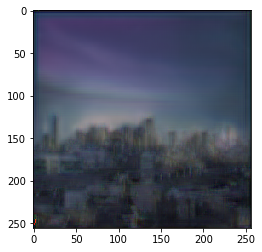

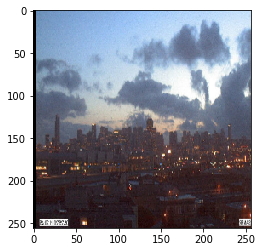

Epoch - 197
Discriminator Loss =  0.15409946 Accuracy = 78.99169921875
GAN Loss =  7.251489
Time Elapsed 0:00:10.958906 

Epoch - 198
Discriminator Loss =  0.14702995 Accuracy = 79.18701171875
GAN Loss =  6.392082
Time Elapsed 0:00:10.871808 

Epoch - 199
Discriminator Loss =  0.15997867 Accuracy = 77.67333984375
GAN Loss =  6.448966
Time Elapsed 0:00:10.967750 

Epoch - 200
Discriminator Loss =  0.16080192 Accuracy = 77.94189453125
GAN Loss =  6.776603
Time Elapsed 0:00:10.943190 



In [15]:
import warnings
warnings.filterwarnings("ignore")
train(200,1)

Epoch - 1
Discriminator Loss =  0.14852647 Accuracy = 78.759765625
GAN Loss =  6.5048103
Time Elapsed 0:00:10.935144 



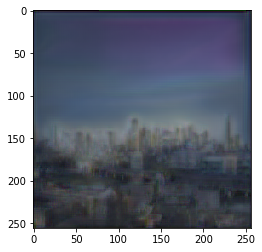

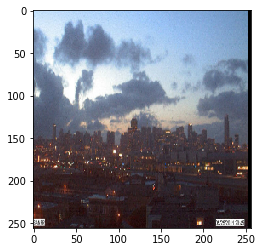

Epoch - 2
Discriminator Loss =  0.15455124 Accuracy = 79.150390625
GAN Loss =  6.410268
Time Elapsed 0:00:10.946294 

Epoch - 3
Discriminator Loss =  0.15682721 Accuracy = 77.25830078125
GAN Loss =  6.5936055
Time Elapsed 0:00:10.755590 

Epoch - 4
Discriminator Loss =  0.15573134 Accuracy = 77.9052734375
GAN Loss =  7.082252
Time Elapsed 0:00:10.684136 

Epoch - 5
Discriminator Loss =  0.14728194 Accuracy = 78.69873046875
GAN Loss =  6.9041905
Time Elapsed 0:00:10.488575 

Epoch - 6
Discriminator Loss =  0.15296608 Accuracy = 78.22265625
GAN Loss =  6.706555
Time Elapsed 0:00:10.629117 



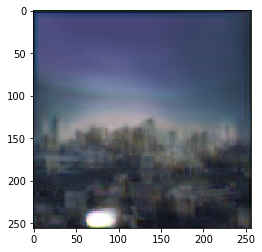

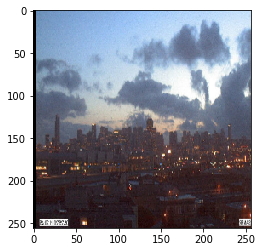

Epoch - 7
Discriminator Loss =  0.15145357 Accuracy = 78.52783203125
GAN Loss =  5.9412255
Time Elapsed 0:00:10.487058 

Epoch - 8
Discriminator Loss =  0.15707812 Accuracy = 78.3935546875
GAN Loss =  6.417414
Time Elapsed 0:00:10.506974 

Epoch - 9
Discriminator Loss =  0.14860705 Accuracy = 78.2470703125
GAN Loss =  5.9675965
Time Elapsed 0:00:10.458555 

Epoch - 10
Discriminator Loss =  0.15639383 Accuracy = 77.99072265625
GAN Loss =  7.162031
Time Elapsed 0:00:10.530982 

Epoch - 11
Discriminator Loss =  0.16062216 Accuracy = 77.74658203125
GAN Loss =  5.9814363
Time Elapsed 0:00:10.514136 



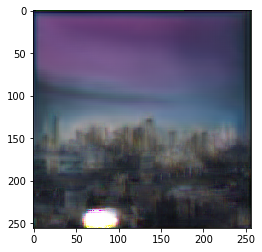

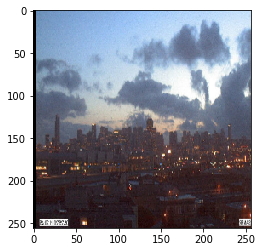

Epoch - 12
Discriminator Loss =  0.15782005 Accuracy = 76.69677734375
GAN Loss =  6.3929358
Time Elapsed 0:00:10.394433 

Epoch - 13
Discriminator Loss =  0.15338498 Accuracy = 77.86865234375
GAN Loss =  6.4237876
Time Elapsed 0:00:10.433922 

Epoch - 14
Discriminator Loss =  0.16399875 Accuracy = 76.1962890625
GAN Loss =  5.8617473
Time Elapsed 0:00:10.392607 

Epoch - 15
Discriminator Loss =  0.1451481 Accuracy = 79.33349609375
GAN Loss =  6.156912
Time Elapsed 0:00:10.466791 

Epoch - 16
Discriminator Loss =  0.1521616 Accuracy = 79.08935546875
GAN Loss =  6.2806444
Time Elapsed 0:00:10.434764 



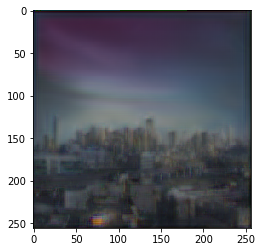

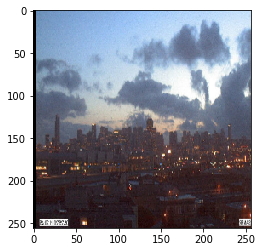

Epoch - 17
Discriminator Loss =  0.15481994 Accuracy = 78.1494140625
GAN Loss =  6.3339887
Time Elapsed 0:00:10.498257 

Epoch - 18
Discriminator Loss =  0.15078184 Accuracy = 77.24609375
GAN Loss =  5.958656
Time Elapsed 0:00:10.410709 

Epoch - 19
Discriminator Loss =  0.1429877 Accuracy = 80.3466796875
GAN Loss =  5.8457203
Time Elapsed 0:00:10.506443 

Epoch - 20
Discriminator Loss =  0.14206627 Accuracy = 78.9306640625
GAN Loss =  6.1336513
Time Elapsed 0:00:10.412188 

Epoch - 21
Discriminator Loss =  0.13906944 Accuracy = 79.9560546875
GAN Loss =  6.6720076
Time Elapsed 0:00:10.530657 



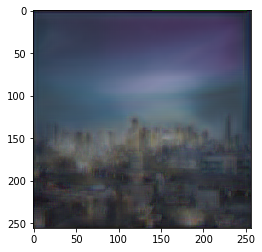

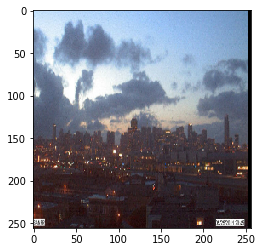

Epoch - 22
Discriminator Loss =  0.15370762 Accuracy = 77.978515625
GAN Loss =  5.837184
Time Elapsed 0:00:10.720482 

Epoch - 23
Discriminator Loss =  0.13950995 Accuracy = 79.3701171875
GAN Loss =  6.9224505
Time Elapsed 0:00:10.753010 

Epoch - 24
Discriminator Loss =  0.1481194 Accuracy = 78.2958984375
GAN Loss =  6.193276
Time Elapsed 0:00:10.794112 

Epoch - 25
Discriminator Loss =  0.14432487 Accuracy = 79.30908203125
GAN Loss =  6.884975
Time Elapsed 0:00:10.755373 

Epoch - 26
Discriminator Loss =  0.1333407 Accuracy = 80.6396484375
GAN Loss =  5.8739843
Time Elapsed 0:00:10.787289 



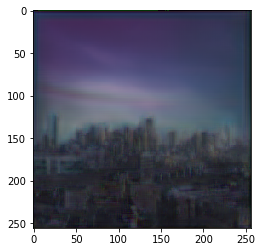

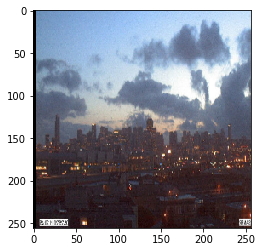

Epoch - 27
Discriminator Loss =  0.13642108 Accuracy = 79.5654296875
GAN Loss =  6.12395
Time Elapsed 0:00:10.764683 

Epoch - 28
Discriminator Loss =  0.1312426 Accuracy = 80.76171875
GAN Loss =  5.800895
Time Elapsed 0:00:10.730807 

Epoch - 29
Discriminator Loss =  0.1397372 Accuracy = 79.67529296875
GAN Loss =  5.489401
Time Elapsed 0:00:10.746298 

Epoch - 30
Discriminator Loss =  0.14378804 Accuracy = 78.47900390625
GAN Loss =  5.8755116
Time Elapsed 0:00:10.730427 

Epoch - 31
Discriminator Loss =  0.13629061 Accuracy = 80.2734375
GAN Loss =  5.8203783
Time Elapsed 0:00:10.826980 



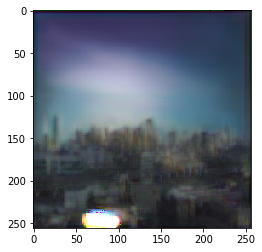

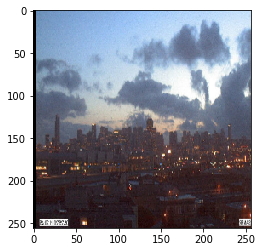

Epoch - 32
Discriminator Loss =  0.13953991 Accuracy = 79.11376953125
GAN Loss =  5.968935
Time Elapsed 0:00:10.854086 

Epoch - 33
Discriminator Loss =  0.14047411 Accuracy = 79.99267578125
GAN Loss =  6.9132237
Time Elapsed 0:00:10.710710 

Epoch - 34
Discriminator Loss =  0.12787557 Accuracy = 81.50634765625
GAN Loss =  5.5919237
Time Elapsed 0:00:10.792735 

Epoch - 35
Discriminator Loss =  0.1339801 Accuracy = 79.296875
GAN Loss =  5.3851314
Time Elapsed 0:00:10.733980 

Epoch - 36
Discriminator Loss =  0.13156572 Accuracy = 79.78515625
GAN Loss =  5.605798
Time Elapsed 0:00:10.737694 



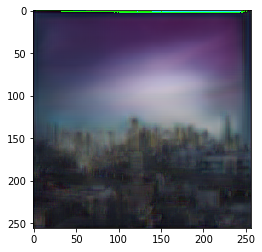

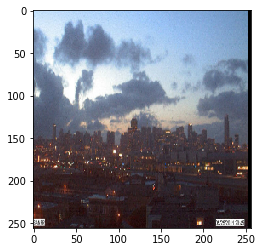

Epoch - 37
Discriminator Loss =  0.14142926 Accuracy = 79.04052734375
GAN Loss =  5.8956203
Time Elapsed 0:00:10.839582 

Epoch - 38
Discriminator Loss =  0.14857839 Accuracy = 79.11376953125
GAN Loss =  5.694914
Time Elapsed 0:00:10.564000 

Epoch - 39
Discriminator Loss =  0.12438515 Accuracy = 80.5908203125
GAN Loss =  6.9494123
Time Elapsed 0:00:10.773136 

Epoch - 40
Discriminator Loss =  0.13728696 Accuracy = 80.23681640625
GAN Loss =  6.0829377
Time Elapsed 0:00:10.723679 

Epoch - 41
Discriminator Loss =  0.12915976 Accuracy = 79.638671875
GAN Loss =  5.775205
Time Elapsed 0:00:10.744949 



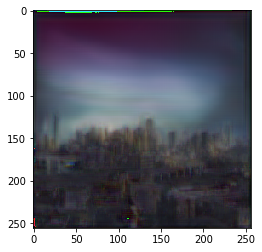

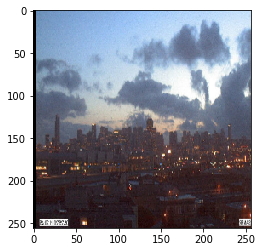

Epoch - 42
Discriminator Loss =  0.13781701 Accuracy = 79.96826171875
GAN Loss =  5.9371443
Time Elapsed 0:00:10.795208 

Epoch - 43
Discriminator Loss =  0.14091727 Accuracy = 80.4931640625
GAN Loss =  5.832808
Time Elapsed 0:00:10.671518 

Epoch - 44
Discriminator Loss =  0.14391685 Accuracy = 77.40478515625
GAN Loss =  5.654483
Time Elapsed 0:00:10.862459 

Epoch - 45
Discriminator Loss =  0.13972841 Accuracy = 80.2001953125
GAN Loss =  5.841567
Time Elapsed 0:00:10.623165 

Epoch - 46
Discriminator Loss =  0.13925378 Accuracy = 80.615234375
GAN Loss =  5.856047
Time Elapsed 0:00:11.045316 



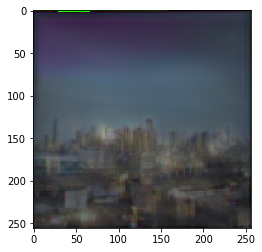

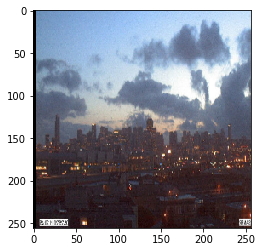

Epoch - 47
Discriminator Loss =  0.14218175 Accuracy = 79.9072265625
GAN Loss =  6.086651
Time Elapsed 0:00:10.900508 

Epoch - 48
Discriminator Loss =  0.14137068 Accuracy = 79.541015625
GAN Loss =  5.6383862
Time Elapsed 0:00:10.800542 

Epoch - 49
Discriminator Loss =  0.11663297 Accuracy = 82.75146484375
GAN Loss =  5.6447353
Time Elapsed 0:00:10.652244 

Epoch - 50
Discriminator Loss =  0.12581217 Accuracy = 81.55517578125
GAN Loss =  5.4487386
Time Elapsed 0:00:10.854635 

Epoch - 51
Discriminator Loss =  0.1410607 Accuracy = 80.6884765625
GAN Loss =  6.150209
Time Elapsed 0:00:10.776754 



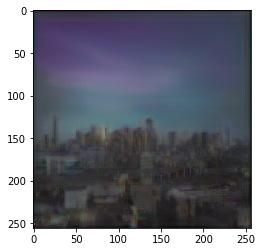

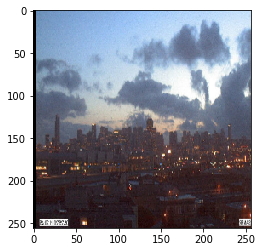

Epoch - 52
Discriminator Loss =  0.13850607 Accuracy = 79.78515625
GAN Loss =  5.343297
Time Elapsed 0:00:10.740733 

Epoch - 53
Discriminator Loss =  0.13245332 Accuracy = 81.201171875
GAN Loss =  5.546947
Time Elapsed 0:00:10.781591 

Epoch - 54
Discriminator Loss =  0.12845065 Accuracy = 81.28662109375
GAN Loss =  5.177092
Time Elapsed 0:00:10.535614 

Epoch - 55
Discriminator Loss =  0.119823635 Accuracy = 82.5439453125
GAN Loss =  5.4139047
Time Elapsed 0:00:10.678638 

Epoch - 56
Discriminator Loss =  0.12864415 Accuracy = 80.26123046875
GAN Loss =  5.8326077
Time Elapsed 0:00:10.718482 



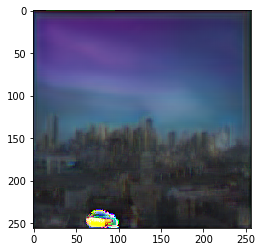

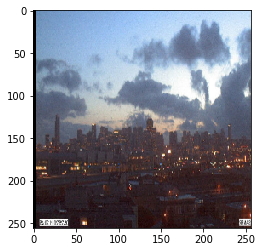

Epoch - 57
Discriminator Loss =  0.12744553 Accuracy = 81.591796875
GAN Loss =  5.756416
Time Elapsed 0:00:10.572595 

Epoch - 58
Discriminator Loss =  0.12135362 Accuracy = 83.02001953125
GAN Loss =  5.204364
Time Elapsed 0:00:10.468100 

Epoch - 59
Discriminator Loss =  0.11182646 Accuracy = 83.984375
GAN Loss =  5.9939437
Time Elapsed 0:00:10.656398 

Epoch - 60
Discriminator Loss =  0.12223096 Accuracy = 82.94677734375
GAN Loss =  5.3690715
Time Elapsed 0:00:10.743769 

Epoch - 61
Discriminator Loss =  0.12996015 Accuracy = 81.06689453125
GAN Loss =  6.462788
Time Elapsed 0:00:10.847519 



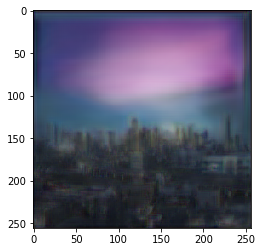

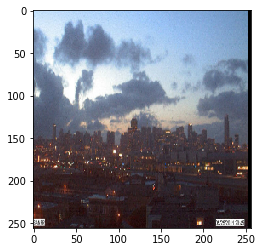

Epoch - 62
Discriminator Loss =  0.122439146 Accuracy = 82.1533203125
GAN Loss =  5.892546
Time Elapsed 0:00:10.735023 

Epoch - 63
Discriminator Loss =  0.10960549 Accuracy = 83.43505859375
GAN Loss =  5.4444246
Time Elapsed 0:00:10.481462 

Epoch - 64
Discriminator Loss =  0.1192943 Accuracy = 83.0078125
GAN Loss =  5.376009
Time Elapsed 0:00:10.337761 

Epoch - 65
Discriminator Loss =  0.12661426 Accuracy = 82.1044921875
GAN Loss =  5.296153
Time Elapsed 0:00:10.405300 

Epoch - 66
Discriminator Loss =  0.12348071 Accuracy = 82.23876953125
GAN Loss =  5.6098604
Time Elapsed 0:00:10.258165 



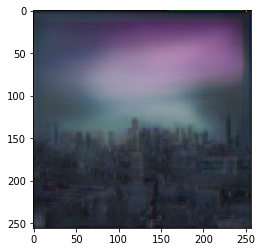

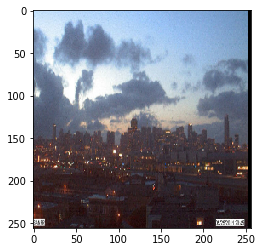

Epoch - 67
Discriminator Loss =  0.12664314 Accuracy = 82.3486328125
GAN Loss =  5.3982744
Time Elapsed 0:00:10.358731 

Epoch - 68
Discriminator Loss =  0.12204293 Accuracy = 81.89697265625
GAN Loss =  5.962504
Time Elapsed 0:00:10.286915 

Epoch - 69
Discriminator Loss =  0.12376454 Accuracy = 83.19091796875
GAN Loss =  5.2841034
Time Elapsed 0:00:10.269650 

Epoch - 70
Discriminator Loss =  0.122122325 Accuracy = 82.87353515625
GAN Loss =  5.045553
Time Elapsed 0:00:10.302847 

Epoch - 71
Discriminator Loss =  0.12172703 Accuracy = 82.82470703125
GAN Loss =  4.979858
Time Elapsed 0:00:10.290653 



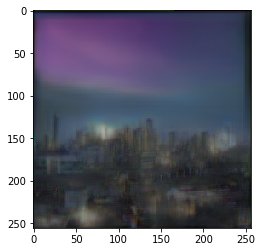

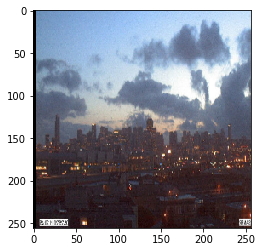

Epoch - 72
Discriminator Loss =  0.14061865 Accuracy = 81.2255859375
GAN Loss =  5.1255426
Time Elapsed 0:00:10.374668 

Epoch - 73
Discriminator Loss =  0.11955379 Accuracy = 83.60595703125
GAN Loss =  5.492707
Time Elapsed 0:00:10.286030 

Epoch - 74
Discriminator Loss =  0.118489236 Accuracy = 82.89794921875
GAN Loss =  5.2015586
Time Elapsed 0:00:10.262391 

Epoch - 75
Discriminator Loss =  0.11600627 Accuracy = 84.06982421875
GAN Loss =  5.347564
Time Elapsed 0:00:10.302799 

Epoch - 76
Discriminator Loss =  0.11559126 Accuracy = 82.14111328125
GAN Loss =  5.446199
Time Elapsed 0:00:10.316128 



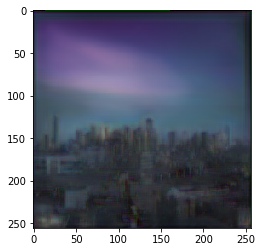

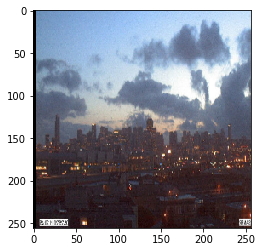

Epoch - 77
Discriminator Loss =  0.12007399 Accuracy = 83.49609375
GAN Loss =  5.450211
Time Elapsed 0:00:10.370873 

Epoch - 78
Discriminator Loss =  0.105652235 Accuracy = 84.19189453125
GAN Loss =  5.215689
Time Elapsed 0:00:10.282744 

Epoch - 79
Discriminator Loss =  0.121325694 Accuracy = 83.154296875
GAN Loss =  5.224262
Time Elapsed 0:00:10.310552 

Epoch - 80
Discriminator Loss =  0.11772199 Accuracy = 83.63037109375
GAN Loss =  5.8640676
Time Elapsed 0:00:10.282895 

Epoch - 81
Discriminator Loss =  0.110918716 Accuracy = 84.21630859375
GAN Loss =  4.948149
Time Elapsed 0:00:10.278997 



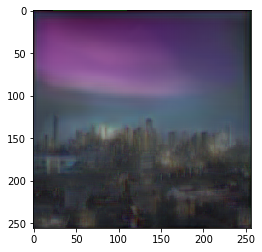

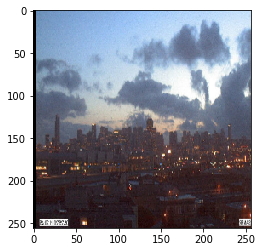

Epoch - 82
Discriminator Loss =  0.11842197 Accuracy = 83.70361328125
GAN Loss =  5.1645627
Time Elapsed 0:00:10.264412 

Epoch - 83
Discriminator Loss =  0.12725395 Accuracy = 81.25
GAN Loss =  5.469335
Time Elapsed 0:00:10.298935 

Epoch - 84
Discriminator Loss =  0.11441651 Accuracy = 81.92138671875
GAN Loss =  5.924331
Time Elapsed 0:00:10.259058 

Epoch - 85
Discriminator Loss =  0.118661284 Accuracy = 81.67724609375
GAN Loss =  5.873455
Time Elapsed 0:00:10.249996 

Epoch - 86
Discriminator Loss =  0.12540267 Accuracy = 80.70068359375
GAN Loss =  5.8400536
Time Elapsed 0:00:10.242840 



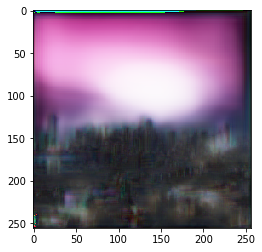

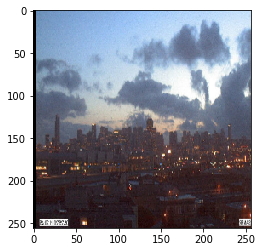

Epoch - 87
Discriminator Loss =  0.11816323 Accuracy = 81.6650390625
GAN Loss =  5.4113708
Time Elapsed 0:00:10.327983 

Epoch - 88
Discriminator Loss =  0.11927983 Accuracy = 84.7412109375
GAN Loss =  5.2453117
Time Elapsed 0:00:10.304979 

Epoch - 89
Discriminator Loss =  0.1139104 Accuracy = 86.9140625
GAN Loss =  5.3290334
Time Elapsed 0:00:10.306444 

Epoch - 90
Discriminator Loss =  0.1078695 Accuracy = 85.55908203125
GAN Loss =  5.4989467
Time Elapsed 0:00:10.294117 

Epoch - 91
Discriminator Loss =  0.118138224 Accuracy = 82.82470703125
GAN Loss =  5.1126094
Time Elapsed 0:00:10.329198 



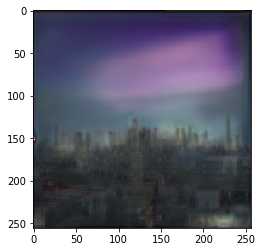

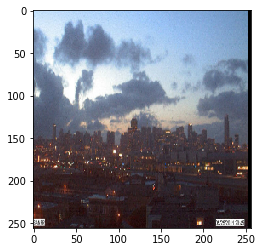

Epoch - 92
Discriminator Loss =  0.111097865 Accuracy = 86.1083984375
GAN Loss =  5.0417647
Time Elapsed 0:00:10.358733 

Epoch - 93
Discriminator Loss =  0.12454589 Accuracy = 83.349609375
GAN Loss =  5.172224
Time Elapsed 0:00:10.290242 

Epoch - 94
Discriminator Loss =  0.116090864 Accuracy = 84.33837890625
GAN Loss =  5.3254814
Time Elapsed 0:00:10.272893 

Epoch - 95
Discriminator Loss =  0.112092875 Accuracy = 81.1767578125
GAN Loss =  5.2556515
Time Elapsed 0:00:10.327128 

Epoch - 96
Discriminator Loss =  0.10494153 Accuracy = 86.04736328125
GAN Loss =  5.7194624
Time Elapsed 0:00:10.321214 



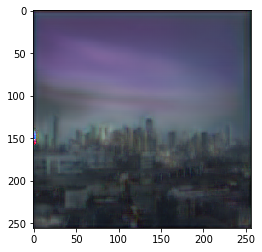

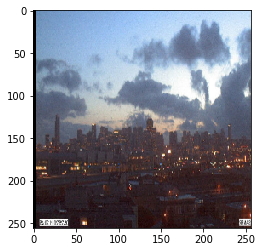

Epoch - 97
Discriminator Loss =  0.12242985 Accuracy = 81.93359375
GAN Loss =  5.724025
Time Elapsed 0:00:10.363063 

Epoch - 98
Discriminator Loss =  0.12469076 Accuracy = 82.2265625
GAN Loss =  6.302572
Time Elapsed 0:00:10.273872 

Epoch - 99
Discriminator Loss =  0.11850825 Accuracy = 84.765625
GAN Loss =  5.3690596
Time Elapsed 0:00:10.333680 

Epoch - 100
Discriminator Loss =  0.115885705 Accuracy = 83.89892578125
GAN Loss =  5.0722733
Time Elapsed 0:00:10.365456 



In [16]:
train(100,1)

Epoch - 1
Discriminator Loss =  0.11843899 Accuracy = 84.326171875
GAN Loss =  5.062691
Time Elapsed 0:00:10.415950 



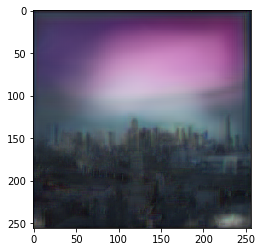

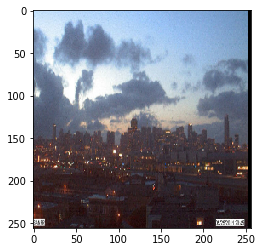

Epoch - 2
Discriminator Loss =  0.10805003 Accuracy = 87.109375
GAN Loss =  5.7535787
Time Elapsed 0:00:10.356237 

Epoch - 3
Discriminator Loss =  0.11329643 Accuracy = 83.7646484375
GAN Loss =  7.001101
Time Elapsed 0:00:10.284884 

Epoch - 4
Discriminator Loss =  0.11183313 Accuracy = 84.33837890625
GAN Loss =  5.536756
Time Elapsed 0:00:10.315407 

Epoch - 5
Discriminator Loss =  0.11319915 Accuracy = 87.4755859375
GAN Loss =  5.4613924
Time Elapsed 0:00:10.296204 

Epoch - 6
Discriminator Loss =  0.08793227 Accuracy = 88.134765625
GAN Loss =  5.5437403
Time Elapsed 0:00:10.290971 



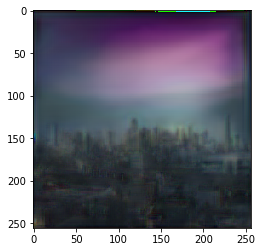

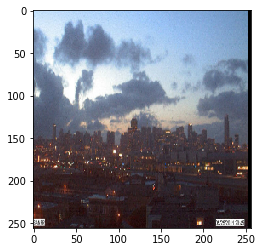

Epoch - 7
Discriminator Loss =  0.093369775 Accuracy = 86.36474609375
GAN Loss =  5.7935095
Time Elapsed 0:00:10.310521 

Epoch - 8
Discriminator Loss =  0.1013304 Accuracy = 86.9873046875
GAN Loss =  5.4119673
Time Elapsed 0:00:10.321182 

Epoch - 9
Discriminator Loss =  0.09570367 Accuracy = 85.24169921875
GAN Loss =  5.6988735
Time Elapsed 0:00:10.324366 

Epoch - 10
Discriminator Loss =  0.10529296 Accuracy = 86.75537109375
GAN Loss =  5.6218348
Time Elapsed 0:00:10.347557 

Epoch - 11
Discriminator Loss =  0.10095987 Accuracy = 85.9375
GAN Loss =  5.225945
Time Elapsed 0:00:10.313626 



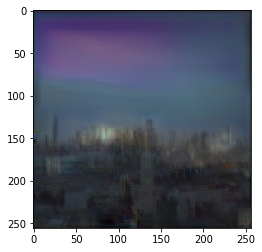

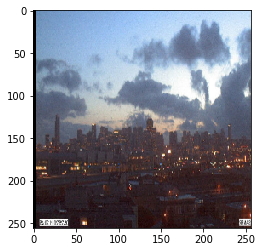

Epoch - 12
Discriminator Loss =  0.09305543 Accuracy = 88.14697265625
GAN Loss =  5.546792
Time Elapsed 0:00:10.358055 

Epoch - 13
Discriminator Loss =  0.106031194 Accuracy = 86.02294921875
GAN Loss =  6.0287995
Time Elapsed 0:00:10.289448 

Epoch - 14
Discriminator Loss =  0.10191358 Accuracy = 88.24462890625
GAN Loss =  6.5536313
Time Elapsed 0:00:10.292539 

Epoch - 15
Discriminator Loss =  0.10499883 Accuracy = 87.2802734375
GAN Loss =  5.476299
Time Elapsed 0:00:10.292991 

Epoch - 16
Discriminator Loss =  0.11023082 Accuracy = 84.33837890625
GAN Loss =  6.3090467
Time Elapsed 0:00:10.287905 



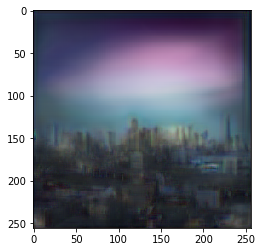

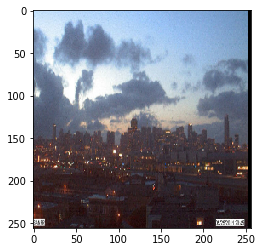

Epoch - 17
Discriminator Loss =  0.096330516 Accuracy = 90.33203125
GAN Loss =  6.874945
Time Elapsed 0:00:10.364453 

Epoch - 18
Discriminator Loss =  0.099284805 Accuracy = 88.2568359375
GAN Loss =  5.0998664
Time Elapsed 0:00:10.316204 

Epoch - 19
Discriminator Loss =  0.09514277 Accuracy = 88.14697265625
GAN Loss =  5.0668917
Time Elapsed 0:00:10.329694 

Epoch - 20
Discriminator Loss =  0.10955143 Accuracy = 84.24072265625
GAN Loss =  5.4344525
Time Elapsed 0:00:10.274888 

Epoch - 21
Discriminator Loss =  0.097025774 Accuracy = 86.572265625
GAN Loss =  5.8460603
Time Elapsed 0:00:10.289776 



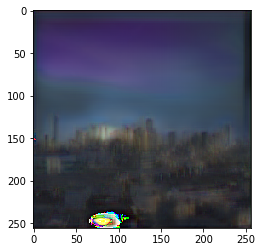

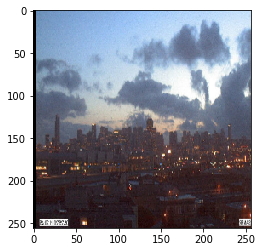

Epoch - 22
Discriminator Loss =  0.11400678 Accuracy = 85.46142578125
GAN Loss =  5.753999
Time Elapsed 0:00:10.375181 

Epoch - 23
Discriminator Loss =  0.097999915 Accuracy = 87.8173828125
GAN Loss =  5.638913
Time Elapsed 0:00:10.277637 

Epoch - 24
Discriminator Loss =  0.09605405 Accuracy = 88.78173828125
GAN Loss =  4.9739256
Time Elapsed 0:00:10.293263 

Epoch - 25
Discriminator Loss =  0.09441444 Accuracy = 90.8203125
GAN Loss =  4.744677
Time Elapsed 0:00:10.295450 

Epoch - 26
Discriminator Loss =  0.092550054 Accuracy = 87.3046875
GAN Loss =  5.2105637
Time Elapsed 0:00:10.313936 



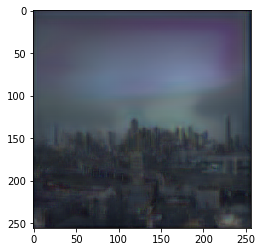

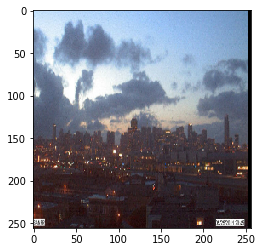

Epoch - 27
Discriminator Loss =  0.10258062 Accuracy = 86.4013671875
GAN Loss =  4.8658333
Time Elapsed 0:00:10.295554 

Epoch - 28
Discriminator Loss =  0.091787264 Accuracy = 87.4755859375
GAN Loss =  4.7646127
Time Elapsed 0:00:10.345926 

Epoch - 29
Discriminator Loss =  0.1102667 Accuracy = 85.498046875
GAN Loss =  4.7987943
Time Elapsed 0:00:10.232474 

Epoch - 30
Discriminator Loss =  0.0916466 Accuracy = 90.14892578125
GAN Loss =  4.716503
Time Elapsed 0:00:10.317534 

Epoch - 31
Discriminator Loss =  0.087665066 Accuracy = 88.31787109375
GAN Loss =  5.0314455
Time Elapsed 0:00:10.345853 



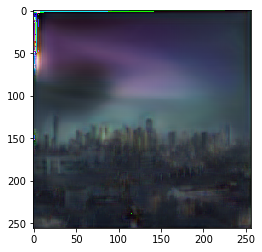

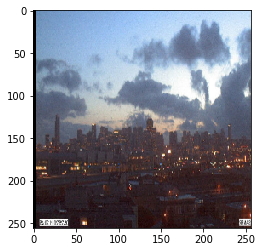

Epoch - 32
Discriminator Loss =  0.1017275 Accuracy = 89.02587890625
GAN Loss =  5.7670465
Time Elapsed 0:00:10.347065 

Epoch - 33
Discriminator Loss =  0.099475905 Accuracy = 86.14501953125
GAN Loss =  5.202008
Time Elapsed 0:00:10.348247 

Epoch - 34
Discriminator Loss =  0.11017143 Accuracy = 85.6689453125
GAN Loss =  4.9724493
Time Elapsed 0:00:10.372748 

Epoch - 35
Discriminator Loss =  0.085267894 Accuracy = 90.0634765625
GAN Loss =  6.146788
Time Elapsed 0:00:10.304499 

Epoch - 36
Discriminator Loss =  0.0989036 Accuracy = 86.3037109375
GAN Loss =  5.251652
Time Elapsed 0:00:10.340042 



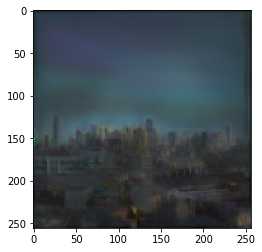

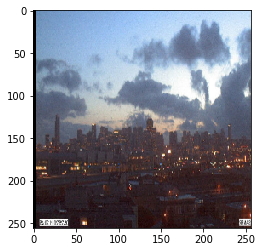

Epoch - 37
Discriminator Loss =  0.100097045 Accuracy = 86.09619140625
GAN Loss =  5.231037
Time Elapsed 0:00:10.344374 

Epoch - 38
Discriminator Loss =  0.084610075 Accuracy = 89.34326171875
GAN Loss =  4.76933
Time Elapsed 0:00:10.313603 

Epoch - 39
Discriminator Loss =  0.1043593 Accuracy = 88.43994140625
GAN Loss =  4.9338193
Time Elapsed 0:00:10.320118 

Epoch - 40
Discriminator Loss =  0.09509071 Accuracy = 88.53759765625
GAN Loss =  5.3460917
Time Elapsed 0:00:10.382251 

Epoch - 41
Discriminator Loss =  0.098076046 Accuracy = 88.623046875
GAN Loss =  4.8624363
Time Elapsed 0:00:10.320540 



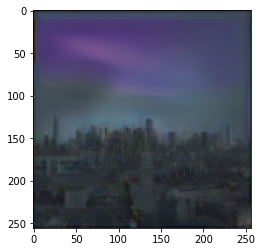

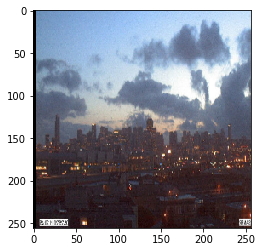

Epoch - 42
Discriminator Loss =  0.107534245 Accuracy = 85.16845703125
GAN Loss =  5.322429
Time Elapsed 0:00:10.339673 

Epoch - 43
Discriminator Loss =  0.09770741 Accuracy = 88.818359375
GAN Loss =  4.9212084
Time Elapsed 0:00:10.297383 

Epoch - 44
Discriminator Loss =  0.09501214 Accuracy = 88.14697265625
GAN Loss =  5.343398
Time Elapsed 0:00:10.332931 

Epoch - 45
Discriminator Loss =  0.09573287 Accuracy = 88.56201171875
GAN Loss =  5.0127378
Time Elapsed 0:00:10.311166 

Epoch - 46
Discriminator Loss =  0.09100019 Accuracy = 88.134765625
GAN Loss =  4.6328626
Time Elapsed 0:00:10.322566 



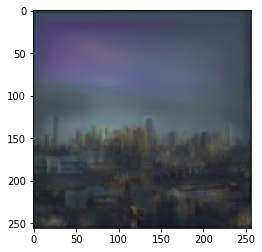

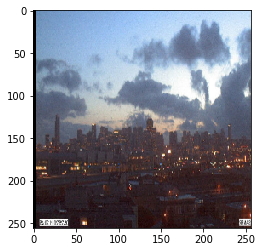

Epoch - 47
Discriminator Loss =  0.099040255 Accuracy = 86.767578125
GAN Loss =  5.303494
Time Elapsed 0:00:10.390859 

Epoch - 48
Discriminator Loss =  0.101962365 Accuracy = 85.546875
GAN Loss =  4.816511
Time Elapsed 0:00:10.309748 

Epoch - 49
Discriminator Loss =  0.08931448 Accuracy = 89.74609375
GAN Loss =  4.7301135
Time Elapsed 0:00:10.306703 

Epoch - 50
Discriminator Loss =  0.114519686 Accuracy = 83.82568359375
GAN Loss =  4.9158826
Time Elapsed 0:00:10.362342 



In [17]:
train(50,1)

In [14]:

def load_images(dataset,batch_size,epoch):
    chance = np.random.random()
    #path = glob('cityscapes/train/*')
#     images = np.random.choice(path, size=batch_size)
    images = day[epoch*batch_size:(epoch+1)*batch_size]
    img_real = []
    rootdir = 'imageAlignedLD/'
    img_labelled = []
    for imagepath in images:
        real_img = imread(rootdir+imagepath[0])
        labelled_img = imread(rootdir+imagepath[1])
        #width = img.shape[1]
        #width = width//2
        #real_img, labelled_img = img[:, width:, :],img[:, :width, :]
        real_img,labelled_img = transform.resize(real_img, resolution),transform.resize(labelled_img, resolution)
        if (chance<0.5):
            real_img = np.fliplr(real_img)
            labelled_img = np.fliplr(labelled_img)
        img_real.append(real_img)
        img_labelled.append(labelled_img)
    if(dataset=='55'):
        return np.array(img_real), np.array(img_labelled)
    return np.array(img_labelled), np.array(img_real)

'''
# REMEBER! - arr1(A) is the actual truth. arr2(B) is the labelled graphical image

# for batch_i, (imgs_A, imgs_B) in enumerate(load_images(1,2)):
#     print("hey")
arr1,arr2 = load_images('1',32,12)
# arr1.shape

# Testing the GAN

for i in range(0,10):
    truth,labelled = load_images_test('edges2shoes',1,i+100)
    predict = g.predict(labelled)
    plt.imshow(predict[0])  
    plt.show()
    plt.imshow(truth[0])
    plt.show()'''



'\n# REMEBER! - arr1(A) is the actual truth. arr2(B) is the labelled graphical image\n\n# for batch_i, (imgs_A, imgs_B) in enumerate(load_images(1,2)):\n#     print("hey")\narr1,arr2 = load_images(\'1\',32,12)\n# arr1.shape\n\n# Testing the GAN\n\nfor i in range(0,10):\n    truth,labelled = load_images_test(\'edges2shoes\',1,i+100)\n    predict = g.predict(labelled)\n    plt.imshow(predict[0])  \n    plt.show()\n    plt.imshow(truth[0])\n    plt.show()'

In [0]:
import pandas as pd
import numpy as np

#print(np.unravel_index(np.argmax(dist), dist.shape))

df = pd.read_csv('annotations.tsv', usecols=[0,2,3], names=['image', 'sunny', 'night'], header=None, sep = '\t')
df['fol']= [x.split('/')[0] for x in df['image'].tolist()]

df.head()

In [12]:
day = []
b = df.groupby('fol')
for i,j in b:
    a = j['image'].tolist()[np.unravel_index(np.argmax(np.array(j['sunny'].tolist())), np.array(j['sunny'].tolist()).shape)[0]]
    c = j['image'].tolist()[np.unravel_index(np.argmax(np.array(j['night'].tolist())), np.array(j['night'].tolist()).shape)[0]]
    day.append([a,c])
print(day)

[['00000064/115.jpg', '00000064/153.jpg'], ['00000090/113.jpg', '00000090/6.jpg'], ['00000162/156.jpg', '00000162/119.jpg'], ['00000260/115.jpg', '00000260/51.jpg'], ['00000270/108.jpg', '00000270/12.jpg'], ['00000325/10.jpg', '00000325/1.jpg'], ['00000384/106.jpg', '00000384/23.jpg'], ['00000398/1.jpg', '00000398/7.jpg'], ['00000441/1.jpg', '00000441/13.jpg'], ['00000536/105.jpg', '00000536/16.jpg'], ['00000573/104.jpg', '00000573/13.jpg'], ['00001048/20120710_220953.jpg', '00001048/20120706_080937.jpg'], ['00001065/20120117_225619.jpg', '00001065/20110311_045619.jpg'], ['00001308/20111201_142515.jpg', '00001308/20111209_122514.jpg'], ['00005381/20110305_141022.jpg', '00005381/20110118_011023.jpg'], ['00007202/20110621_080103.jpg', '00007202/20110116_163103.jpg'], ['00007371/20110321_091715.jpg', '00007371/20121226_164731.jpg'], ['00008205/20110414_142726.jpg', '00008205/20110118_005718.jpg'], ['00008346/20110114_114559.jpg', '00008346/20110220_141558.jpg'], ['00008383/20110207_115220

In [0]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive 
from google.colab import auth 
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()                       
drive = GoogleDrive(gauth)

In [0]:
g.save_weights('D2Ngen.h5')
model_file = drive.CreateFile({'title' : 'D2Ngen.h5'})                       
model_file.SetContentFile('D2Ngen.h5')                       
model_file.Upload()

In [0]:
heaven.save_weights('D2Ndisc.h5')
model_file = drive.CreateFile({'title' : 'D2Ndisc.h5'})                       
model_file.SetContentFile('D2Ndisc.h5')                       
model_file.Upload()